# Movies Scoring and Clustering 

This example uses the 'filmtv_movies' dataset to evaluate the quality of the movies and create clusters of similar movies. You can download the Jupyter Notebook of the study <a href="movies.ipynb">here</a>.

<ul class="ul_content">
    <li><b>year: </b>Movie's release year</li>
    <li><b>filmtv_id: </b>Movie ID</li>
    <li><b>title: </b>Movie title</li>
    <li><b>genre: </b>Movie genre</li>
    <li><b>country: </b>Movie's country of origin</li>
    <li><b>description: </b>Movie description</li>
    <li><b>notes: </b>Information about the movie</li>
    <li><b>duration: </b>Movie duration</li>
    <li><b>votes: </b>Number of votes</li>
    <li><b>avg_vote: </b>Average score</li>
    <li><b>director: </b>Movie director</li>
    <li><b>actors: </b>Actors in the movie</li>  
</ul>
		
We will follow the data science cycle (Data Exploration - Data Preparation - Data Modeling - Model Evaluation - Model Deployment) to solve this problem.

## Initialization

This example uses the following version of VerticaPy:

In [1]:
import verticapy as vp
vp.__version__

'0.9.0'

Connect to Vertica. This example uses an existing connection called "VerticaDSN." For details on how to create a connection, use see the <a href="../../connection.php">connection tutorial</a>.

In [2]:
vp.connect("VerticaDSN")

Let's create a Virtual DataFrame of the dataset. The dataset is available <a href="../../data/filmtv_movies.csv">here</a>.

,123filmtv_idInt,AbctitleVarchar(486),"123yearNumeric(8,2)",AbcgenreVarchar(22),123durationInt,AbccountryVarchar(208),AbcdirectorVarchar(1066),AbcVarchar(2218),"123avg_voteNumeric(6,2)",123votesInt,AbcVarchar(2232),AbcVarchar(1052)
1,18,Diner,1982.0,Comedy,95,United States,Barry Levinson,,7.2,15,,
2,22,A ciascuno il suo,1967.0,Drama,93,Italy,Elio Petri,,7.8,102,"<input style=""background-color: #FAFAFA; border: none; text-align: center; width: 270px;"" type=""text"" value=""Investigations into two murders carried out in a small town in Sicily lead to the conclusion that it was a crime of honor. Paolo Laurana, a high school professor, is not convinced and confides his doubts to the lawyer Rosello. Continuing his investigations, however, Laurana realizes that the principal of the double murder is indeed the lawyer, with the complicity of Luisa, the widow of one of the victims. Laurana dies under the blows of a killer; the lawyer Rosello and Luisa get married."" readonly>",
3,24,A... come assassino,1966.0,Thriller,80,Italy,Ray Morrison (Angelo Dorigo),,6.5,3,,
4,30,A Ghentar si muore facile,1968.0,Adventure,101,Italy,Leon Klimovsky,,5.5,2,,
5,31,Does This Mean We are Married?,1990.0,Comedy,90,United States,Carol Wiseman,,4.0,1,"<input style=""background-color: #FAFAFA; border: none; text-align: center; width: 270px;"" type=""text"" value=""Deena is a young American in search of fortune in Paris in the entertainment world. Just when her residence permit is about to expire she gets a good writing as an actress at a cabaret. To avoid being repatriated, he marries Nick, a penniless musician who accepts white marriage for money. But a series of unexpected events forces Deena and Nick to live together. Cohabitation creates many problems, but the two young people will discover that they are truly in love with each other."" readonly>",

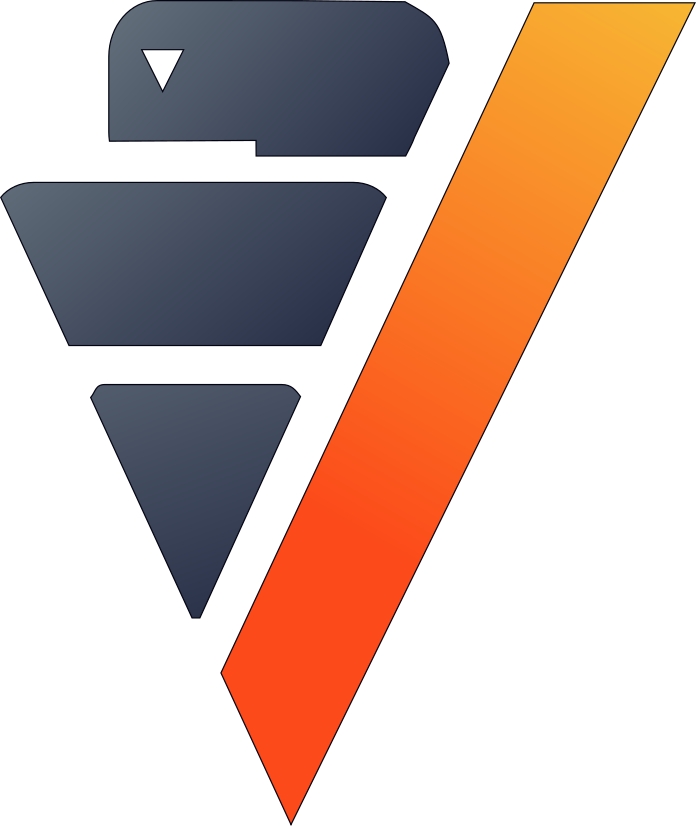

In [3]:
filmtv_movies = vp.read_csv("data/filmtv_movies.csv")
display(filmtv_movies.head(5))

## Data Exploration and Preparation

One of the biggest challenges for any streaming platform is to find a good catalog of movies.

First, let's explore the dataset.

,dtype,count,top,top_percent,unique
"""filmtv_id""",int,53397,18,0.002,53397.0
"""title""",varchar(486),53395,Les Vampires,0.019,50584.0
"""year""","numeric(8,2)",53387,2016.0,3.092,111.0
"""genre""",varchar(22),53195,Drama,30.138,27.0
"""duration""",int,53397,90,11.798,282.0
"""country""",varchar(208),53346,United States,41.141,2394.0
"""director""",varchar(1066),53335,Mario Mattòli,0.137,19160.0
"""actors""",varchar(2218),50372,[null],5.665,50121.0
"""avg_vote""","numeric(6,2)",53397,6.0,15.014,89.0
"""votes""",int,53397,1,22.988,588.0

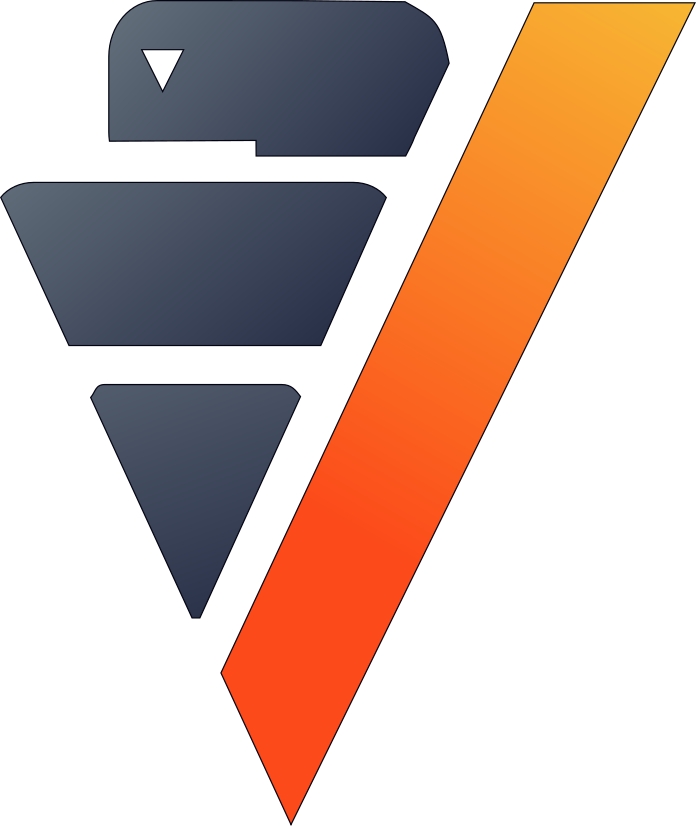

In [4]:
filmtv_movies.describe(method = 'categorical', unique = True)

We can drop the 'description' and 'notes' columns since these fields are empty for most of our dataset.

,123filmtv_idInt,AbcVarchar(486),"123yearNumeric(8,2)",AbcgenreVarchar(22),123durationInt,AbccountryVarchar(208),AbcdirectorVarchar(1066),AbcVarchar(2218),"123avg_voteNumeric(6,2)",123votesInt
1,18,,1982.0,Comedy,95,United States,Barry Levinson,,7.2,15
2,22,,1967.0,Drama,93,Italy,Elio Petri,,7.8,102
3,24,,1966.0,Thriller,80,Italy,Ray Morrison (Angelo Dorigo),,6.5,3
4,30,,1968.0,Adventure,101,Italy,Leon Klimovsky,,5.5,2
5,31,,1990.0,Comedy,90,United States,Carol Wiseman,,4.0,1
6,32,,1990.0,Drama,96,United States,Joseph Ruben,,5.1,107
7,33,,1991.0,Thriller,100,United States,Brian Grant,,8.0,2
8,37,,1975.0,Comedy,100,Italy,Marcello Fondato,,5.9,42
9,41,,1985.0,Drama,110,France,Vera Belmont,,4.0,1
10,42,,1988.0,Drama,110,Hungary,Géza Beremenyi,,8.0,1

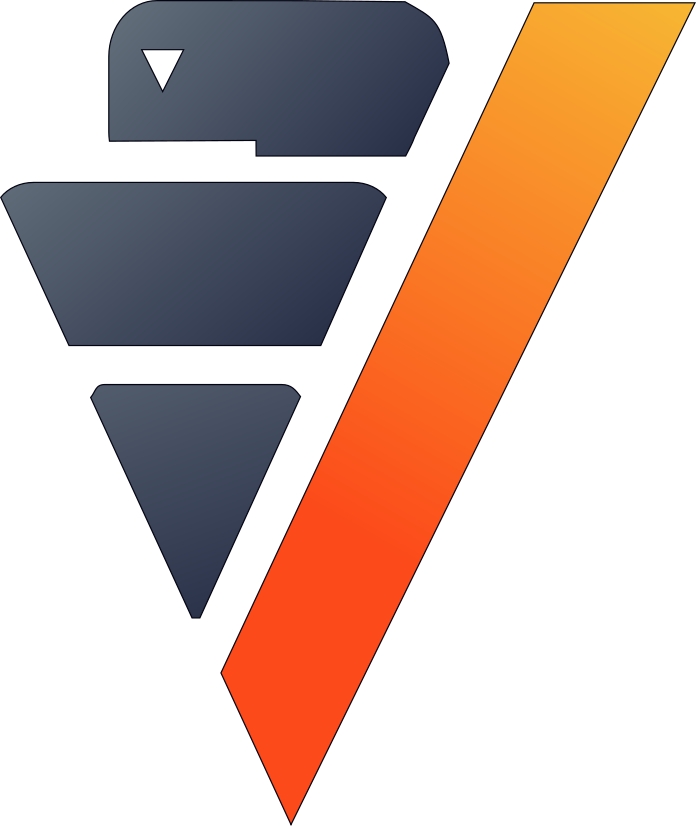

In [5]:
filmtv_movies.drop(["description", "notes"])

We have access to more than 50000 movies in 27 different genres. Let's organize our list by their average rating.

,123filmtv_idInt,AbcVarchar(486),"123yearNumeric(8,2)",AbcgenreVarchar(22),123durationInt,AbcVarchar(208),AbcVarchar(1066),AbcVarchar(2218),"123avg_voteNumeric(6,2)",123votesInt
1,74376,,2013.0,Documentary,193,,,,10.0,1
2,70969,,1969.0,Documentary,378,,,,10.0,1
3,81715,,2015.0,Documentary,99,,,,10.0,1
4,74408,,2013.0,Documentary,87,,,,10.0,1
5,72721,,1987.0,Fantasy,81,,,,10.0,1
6,125083,,2016.0,Drama,65,,,,10.0,1
7,86266,,2018.0,Drama,73,,,,10.0,1
8,82280,,2016.0,Comedy,90,,,,10.0,1
9,79888,,1976.0,Comedy,100,,,,10.0,1
10,75394,,1973.0,Drama,101,,,,10.0,1

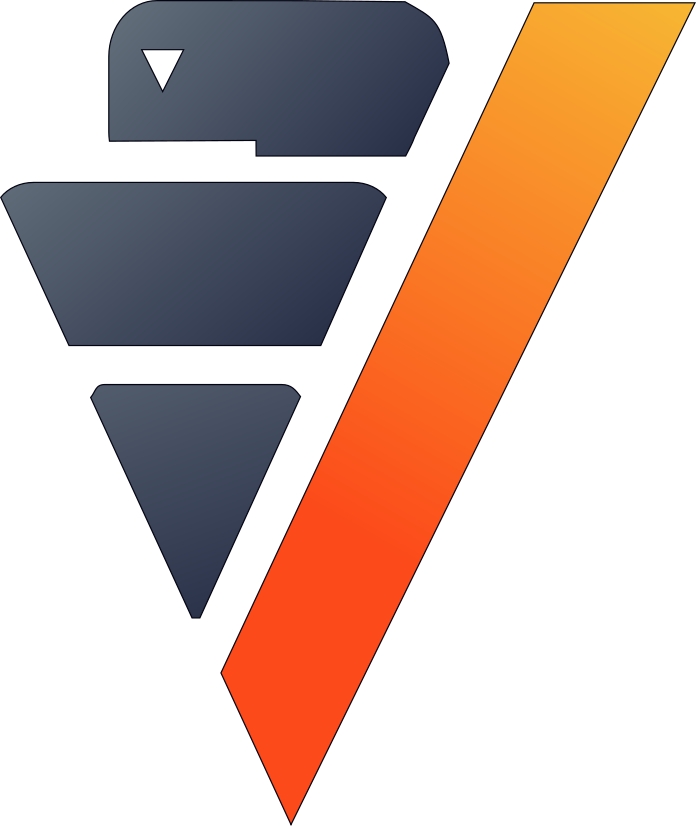

In [6]:
filmtv_movies.sort({"avg_vote" : "desc"})

Since we want properly averaged scores, let's just consider the top 10 movies that have at least 10 votes.

,123filmtv_idInteger,AbcVarchar(486),"123yearNumeric(8,2)",AbcgenreVarchar(22),123durationInteger,AbcVarchar(208),AbcVarchar(1066),AbcVarchar(2218),"123avg_voteNumeric(6,2)",123votesInteger
1,25980,,1992.0,Drama,583,,,,9.8,33
2,29136,,1985.0,Documentary,544,,,,9.6,24
3,16567,,1924.0,Drama,100,,,,9.6,58
4,16584,,1973.0,Comedy,208,,,,9.4,30
5,3831,,1948.0,Drama,90,,,,9.4,477
6,27908,,1962.0,Drama,135,,,,9.4,68
7,12135,,1994.0,Drama,450,,,,9.4,72
8,7753,,1950.0,Drama,100,,,,9.4,535
9,23395,,1954.0,Adventure,200,,,,9.4,325
10,5648,,1941.0,Drama,119,,,,9.4,588

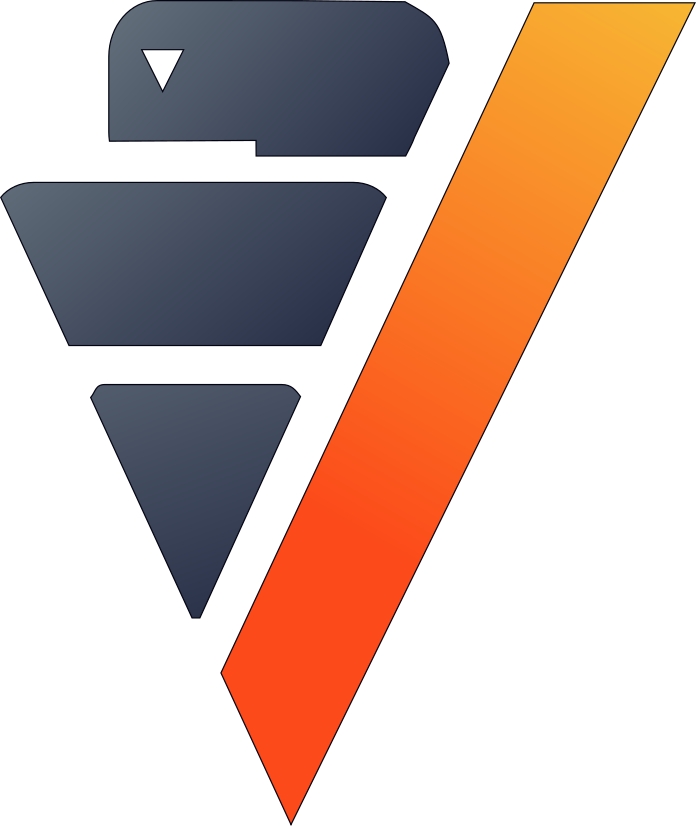

In [7]:
filmtv_movies.search(conditions = [filmtv_movies["votes"] > 10], 
                     order_by = {"avg_vote" : "desc" })

We can see classic movies like 'The Godfather' and 'Greed.' Let's smooth the avg_vote using a linear regression to make it more representative.

To create our model we could use the votes, the category, the duration, etc. but let's go with the director and main actors. 

We can extract the five main actors for each movie with regular expressions.

,value
name,"""actor"""
dtype,varchar(2218)
unique,74885.0
count,191674.0
Others,191083
[null],21914
Totò,100
Ciccio Ingrassia,91
John Wayne,85
Franco Franchi,83

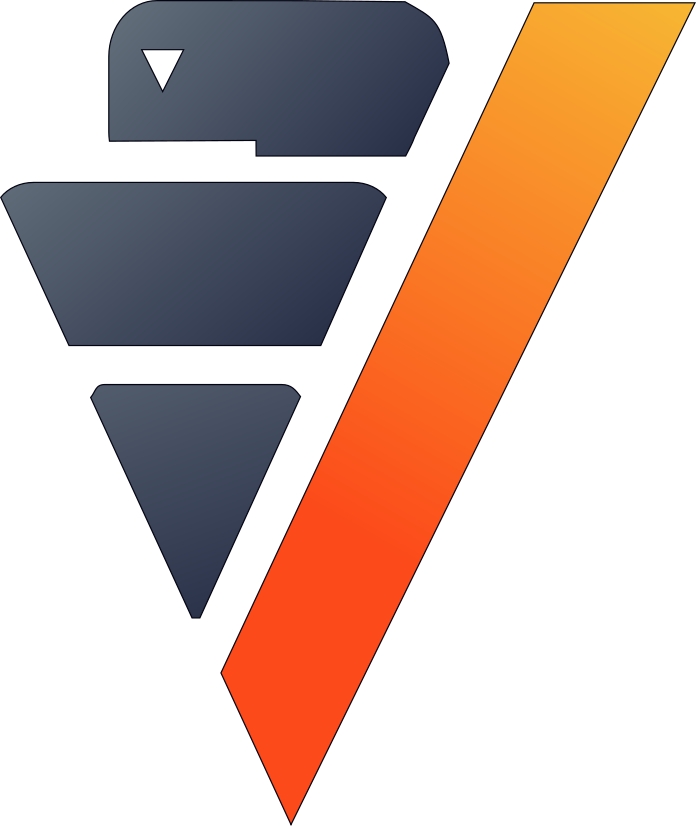

In [8]:
for i in range(1, 5):
    filmtv_movies2 = vp.read_csv("data/filmtv_movies.csv")
    filmtv_movies2.regexp(column = "actors",
                          method = "substr",
                          pattern = '[^,]+',
                          occurrence = i,
                          name = "actor")
    if i == 1:
        filmtv_movies = filmtv_movies2.copy()
    else:
        filmtv_movies = filmtv_movies.append(filmtv_movies2)
filmtv_movies["actor"].describe()

By aggregating the data, we can find the number of actors and the number of votes by actor. We can then normalize the data using the min-max method and quantify the notoriety of the actors.

1 element was filtered.


,AbcactorVarchar(2218),123notoriety_actorsFloat,123castings_actorsInteger
1,Claire Brosseau,0.000304971027752,1
2,Uberto Kovacevich,0.000304971027752,1
3,Julie Bishop,0.002846396259022,3
4,Guillaume Lemay-Thivierge,0.0,1
5,Keith Morris,0.000101657009251,1
6,Carl Brisson,0.004879536444038,2
7,Ameko Eks Mass Carroll,0.000609942055505,1
8,Claudio Santamaria,0.131137541933516,16
9,Paul Lukather,0.000508285046254,1
10,Ben Gavin,0.001219884111009,2

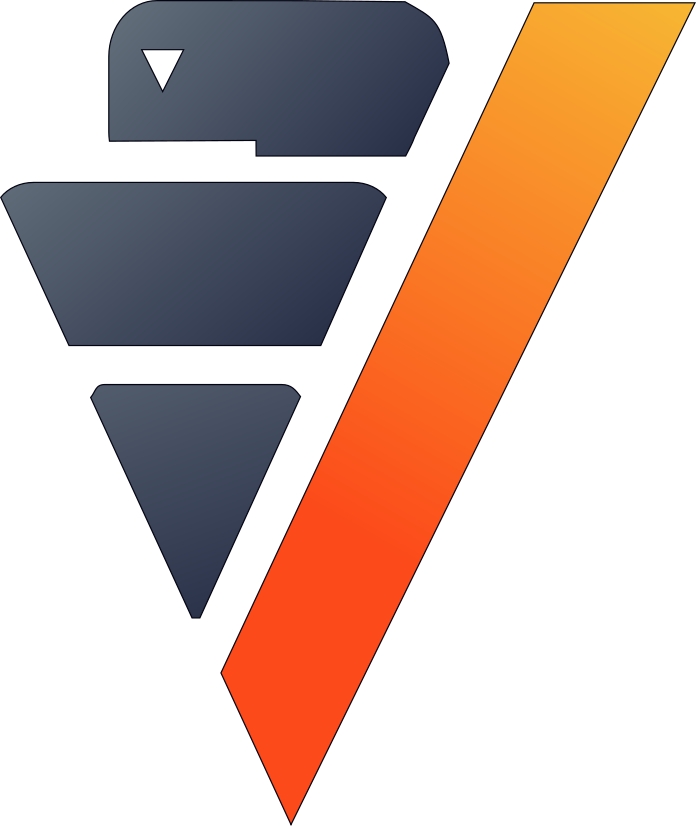

In [9]:
import verticapy.stats as st
actors_stats = filmtv_movies.groupby(columns = ["actor"], 
                                     expr = [st.sum(filmtv_movies["votes"])._as("notoriety_actors"),
                                             st.count(filmtv_movies["actors"])._as("castings_actors")])
actors_stats["actor"].dropna()
actors_stats["notoriety_actors"].normalize(method = 'minmax')

Let's look at the top ten actors by notoriety.

,AbcactorVarchar(2218),"123notoriety_actorsNumeric(34,15)",123castings_actorsInteger
1,Robert De Niro,1.0,57
2,Morgan Freeman,0.861441496391176,52
3,Clint Eastwood,0.856460302937888,43
4,Tom Cruise,0.820372064653858,34
5,Johnny Depp,0.814882586154315,34
6,Tom Hanks,0.771881671241232,37
7,Samuel L. Jackson,0.742502795567754,49
8,Brad Pitt,0.72776252922639,26
9,Leonardo DiCaprio,0.715462031107045,20
10,Al Pacino,0.648368405001525,40

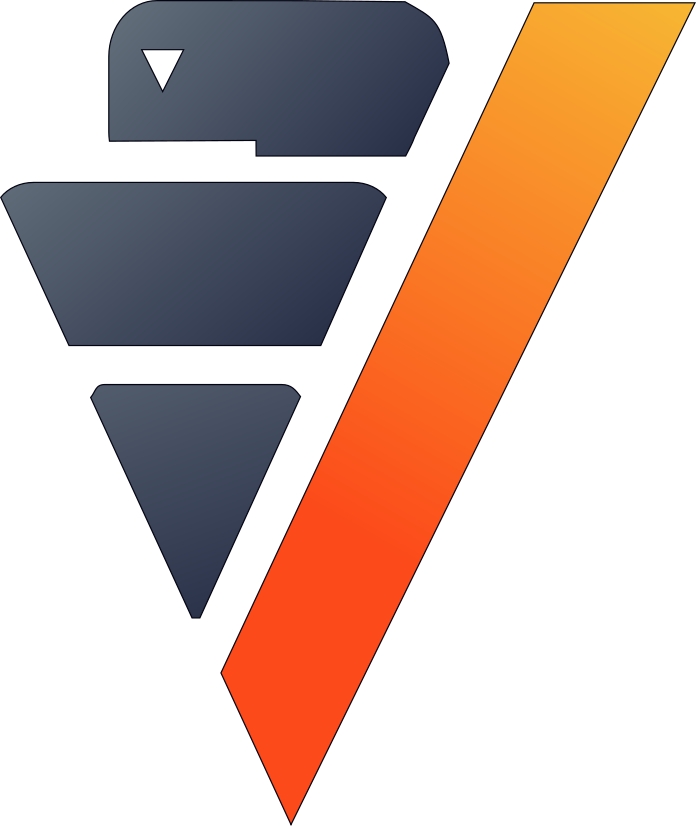

In [10]:
actors_stats.search(order_by = {"notoriety_actors" : "desc", 
                                "castings_actors" : "desc"}).head(10)

As expected, we get a list of very popular actors like Robert De Niro, Morgan Freeman, and Clint Eastwood.

Let's do the same for the directors.

,AbcVarchar(1066),123notoriety_directorFloat,123castings_directorInteger
1,,0.000346620450607,8
2,,0.006585788561525,8
3,,0.000953206239168,8
4,,0.0,4
5,,0.000953206239168,4
6,,0.0,4
7,,0.000346620450607,4
8,,0.007279029462738,24
9,,0.005632582322357,52
10,,0.0,4

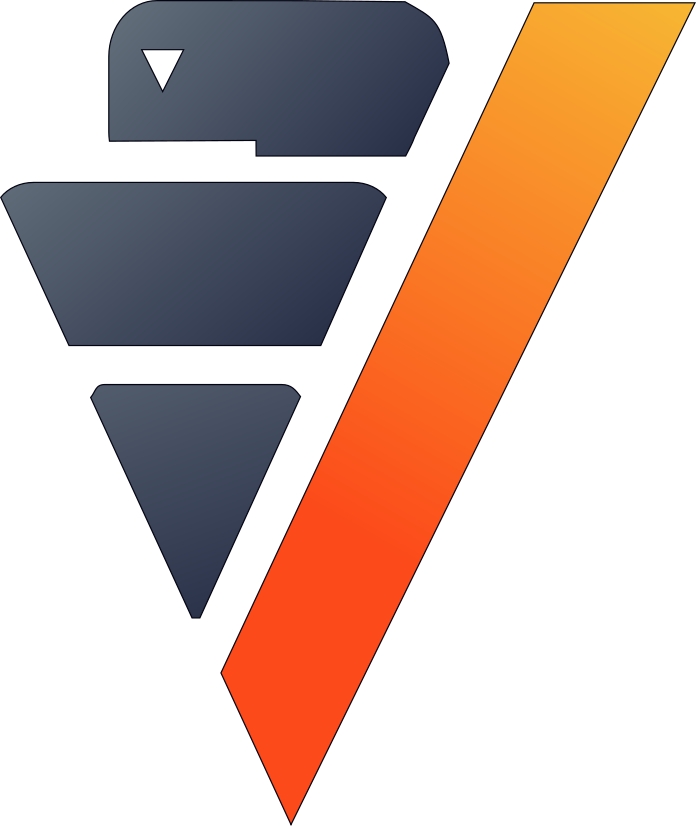

In [11]:
director_stats = filmtv_movies.groupby(columns = ["director"], 
                                       expr = [st.sum(filmtv_movies["votes"])._as("notoriety_director"),
                                               st.count(filmtv_movies["director"])._as("castings_director")])
director_stats["notoriety_director"].normalize(method = 'minmax')

Now let's look at the top 10 movie directors.

,AbcdirectorVarchar(1066),"123notoriety_directorNumeric(34,15)",123castings_directorInteger
1,Steven Spielberg,1.0,132
2,Woody Allen,0.962045060658579,192
3,Clint Eastwood,0.893067590987868,152
4,Martin Scorsese,0.829289428076256,140
5,Alfred Hitchcock,0.753379549393414,208
6,Quentin Tarantino,0.686741767764298,40
7,Ridley Scott,0.655459272097054,108
8,Stanley Kubrick,0.649913344887348,48
9,Tim Burton,0.588214904679376,72
10,David Cronenberg,0.513431542461005,84

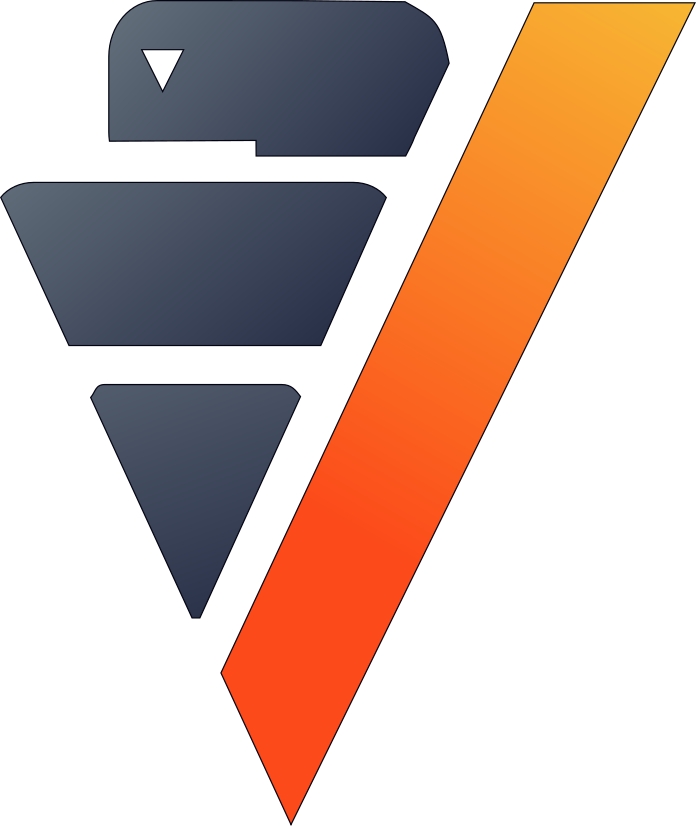

In [16]:
director_stats.search(order_by = {"notoriety_director" : "desc", 
                                  "castings_director" : "desc" }).head(10)

Again, we get a list of popular directors like Steven Spielberg, Woody Allen, and Clint Eastwood.

Let's join our notoriety metrics for actors and directors with the main dataset.

In [12]:
filmtv_movies_director = filmtv_movies.join(
                                    director_stats,
                                    on = {'director': 'director'},
                                    how = "left",
                                    expr1 = ["*"],
                                    expr2 = ["notoriety_director", 
                                             "castings_director"])
filmtv_movies_director_actors = filmtv_movies_director.join(
                                    actors_stats,
                                    on = {'actor': 'actor'},
                                    how = "left",
                                    expr1 = ["*"],
                                    expr2 = ["notoriety_actors",
                                             "castings_actors" ])

As we did many operation, it can be nice to save the vDataFrame as a table in the Vertica database.

,123filmtv_idInt,AbcVarchar(486),"123yearNumeric(8,2)",AbcgenreVarchar(22),123durationInt,AbccountryVarchar(208),AbcdirectorVarchar(1066),AbcVarchar(2218),"123avg_voteNumeric(6,2)",123votesInt,AbcVarchar(2232),AbcVarchar(1052),AbcactorVarchar(2218),"123notoriety_directorNumeric(34,15)",123castings_directorInt,"123notoriety_actorsNumeric(34,15)",123castings_actorsInt
1,18,,1982.0,Comedy,95,United States,Barry Levinson,,7.2,15,,,Mickey Rourke,0.189774696707106,104,0.134492223238792,26
2,18,,1982.0,Comedy,95,United States,Barry Levinson,,7.2,15,,,Steve Guttenberg,0.189774696707106,104,0.048897021449629,14
3,18,,1982.0,Comedy,95,United States,Barry Levinson,,7.2,15,,,Ellen Barkin,0.189774696707106,104,0.096370844769747,27
4,18,,1982.0,Comedy,95,United States,Barry Levinson,,7.2,15,,,Daniel Stern,0.189774696707106,104,0.081935549456135,14
5,22,,1967.0,Drama,93,Italy,Elio Petri,,7.8,102,"<input style=""background-color: #FAFAFA; border: none; text-align: center; width: 270px;"" type=""text"" value=""Investigations into two murders carried out in a small town in Sicily lead to the conclusion that it was a crime of honor. Paolo Laurana, a high school professor, is not convinced and confides his doubts to the lawyer Rosello. Continuing his investigations, however, Laurana realizes that the principal of the double murder is indeed the lawyer, with the complicity of Luisa, the widow of one of the victims. Laurana dies under the blows of a killer; the lawyer Rosello and Luisa get married."" readonly>",,Gian Maria Volonté,0.1078856152513,48,0.230253125953034,35
6,22,,1967.0,Drama,93,Italy,Elio Petri,,7.8,102,"<input style=""background-color: #FAFAFA; border: none; text-align: center; width: 270px;"" type=""text"" value=""Investigations into two murders carried out in a small town in Sicily lead to the conclusion that it was a crime of honor. Paolo Laurana, a high school professor, is not convinced and confides his doubts to the lawyer Rosello. Continuing his investigations, however, Laurana realizes that the principal of the double murder is indeed the lawyer, with the complicity of Luisa, the widow of one of the victims. Laurana dies under the blows of a killer; the lawyer Rosello and Luisa get married."" readonly>",,Salvo Randone,0.1078856152513,48,0.124733150350717,24
7,22,,1967.0,Drama,93,Italy,Elio Petri,,7.8,102,"<input style=""background-color: #FAFAFA; border: none; text-align: center; width: 270px;"" type=""text"" value=""Investigations into two murders carried out in a small town in Sicily lead to the conclusion that it was a crime of honor. Paolo Laurana, a high school professor, is not convinced and confides his doubts to the lawyer Rosello. Continuing his investigations, however, Laurana realizes that the principal of the double murder is indeed the lawyer, with the complicity of Luisa, the widow of one of the victims. Laurana dies under the blows of a killer; the lawyer Rosello and Luisa get married."" readonly>",,Gabriele Ferzetti,0.1078856152513,48,0.11355087933313,57
8,22,,1967.0,Drama,93,Italy,Elio Petri,,7.8,102,"<input style=""background-color: #FAFAFA; border: none; text-align: center; width: 270px;"" type=""text"" value=""Investigations into two murders carried out in a small town in Sicily lead to the conclusion that it was a crime of honor. Paolo Laurana, a high school professor, is not convinced and confides his doubts to the lawyer Rosello. Continuing his investigations, however, Laurana realizes that the principal of the double murder is indeed the lawyer, with the complicity of Luisa, the widow of one of the victims. Laurana dies under the blows of a killer; the lawyer Rosello and Luisa get married."" readonly>",,Irene Papas,0.1078856152513,48,0.08640845786317,28
9,24,,1966.0,Thriller,80,Italy,Ray Morrison (Angelo Dorigo),,6.5,3,,,Alan Steel,0.000173310225303,4,0.004066280370032,10
10,24,,1966.0,Thriller,80,Italy,Ray Morrison (Angelo Dorigo),,6.5,3,,,Sergio Ciani,0.000173310225303,4,0.000711599064756,4

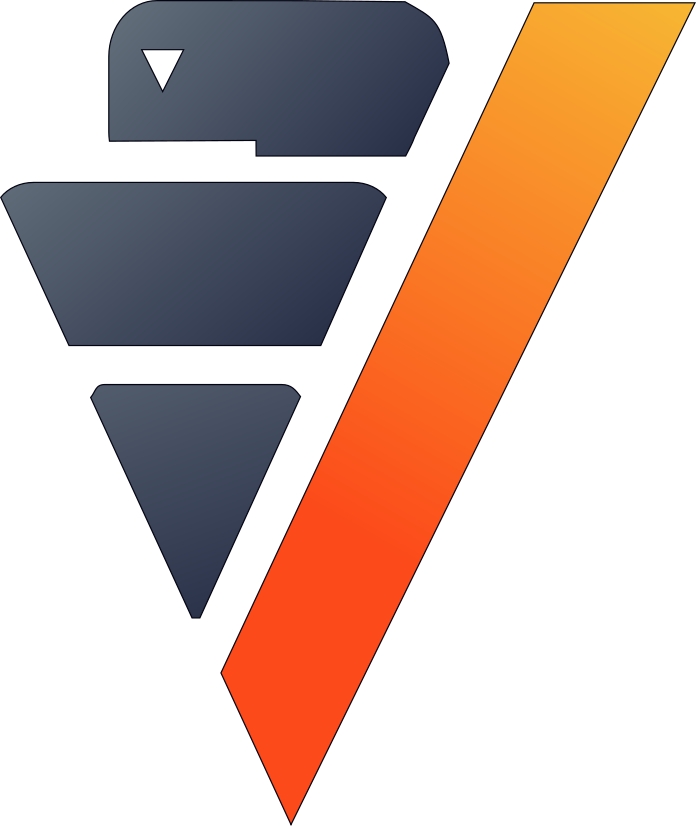

In [15]:
vp.drop("filmtv_movies_director_actors", relation_type = "table")
filmtv_movies_director_actors.to_db(name = "filmtv_movies_director_actors", 
                                    relation_type = "table",
                                    inplace = True)

We can aggregate the data to get metrics on each movie.

In [17]:
filmtv_movies_complete = filmtv_movies_director_actors.groupby(
                            columns = ["filmtv_id", 
                                       "title",
                                       "year",
                                       "genre",
                                       "country",
                                       "avg_vote",
                                       "votes", 
                                       "duration", 
                                       "director", 
                                       "notoriety_director",
                                       "castings_director"],
                            expr = [st.sum(filmtv_movies_director_actors["notoriety_actors"])._as("notoriety_actors"),
                                    st.sum(filmtv_movies_director_actors["castings_actors"])._as("castings_actors")])

Let's compute some statistics on our dataset.

,"123""filmtv_id""Integer100%","123""year""Numeric(8,2)99%","123""avg_vote""Numeric(6,2)100%","123""votes""Integer100%","123""duration""Integer100%","123""notoriety_director""Numeric(34,15)99%","123""castings_director""Integer99%","123""notoriety_actors""Numeric(34,15)94%","123""castings_actors""Integer94%","Abc""title""Varchar(486)99%","Abc""genre""Varchar(22)99%","Abc""country""Varchar(208)99%","Abc""director""Varchar(1066)99%"
dtype,integer,"numeric(8,2)","numeric(6,2)",integer,integer,"numeric(34,15)",integer,"numeric(34,15)",integer,varchar(486),varchar(22),varchar(208),varchar(1066)
percent,100.0,99.981,100.0,100.0,100.0,99.884,99.884,94.335,94.335,99.996,99.622,99.904,99.884
count,53397,53387,53397,53397,53397,53335,53335,50372,50372,53395,53195,53346,53335
top,18,2016.0,6.0,1,90,0.0,4,[null],4,Les Vampires,Drama,United States,Mario Mattòli
top_percent,0.002,3.092,15.014,22.988,11.798,7.976,22.312,5.665,6.043,0.019,30.138,41.141,0.137
avg,44479.2030451149,1990.97834678854,5.84477966926981,24.5417532820196,98.4667865235875,0.0302423093689068,41.6281241211212,0.15134690572669,39.0502660208052,17.5089240565596,6.51405207256321,11.4981629363026,14.9814943283022
stddev,42397.2726447436,22.9007675325025,1.52365642568413,60.9757267844589,35.333011278471,0.0811197000890974,48.0189983882059,0.228791818808308,34.0961946541501,9.67648826656643,1.78457970043876,6.36378402502894,7.9513590648408
min,18,1897.0,0.5,1,40,0.0,4,0.0,1,1,3,4,3
approx_25%,14979.68,1975.0,5.0,2.0,89.0,0.000606585788562,8.0,0.00955575886957388,11.0,11,5,6,12
approx_50%,31301.28125,1997.0,6.0,5.0,95.0,0.004159445407279,24.0,0.0577117542254538,30.0,16,6,13,14

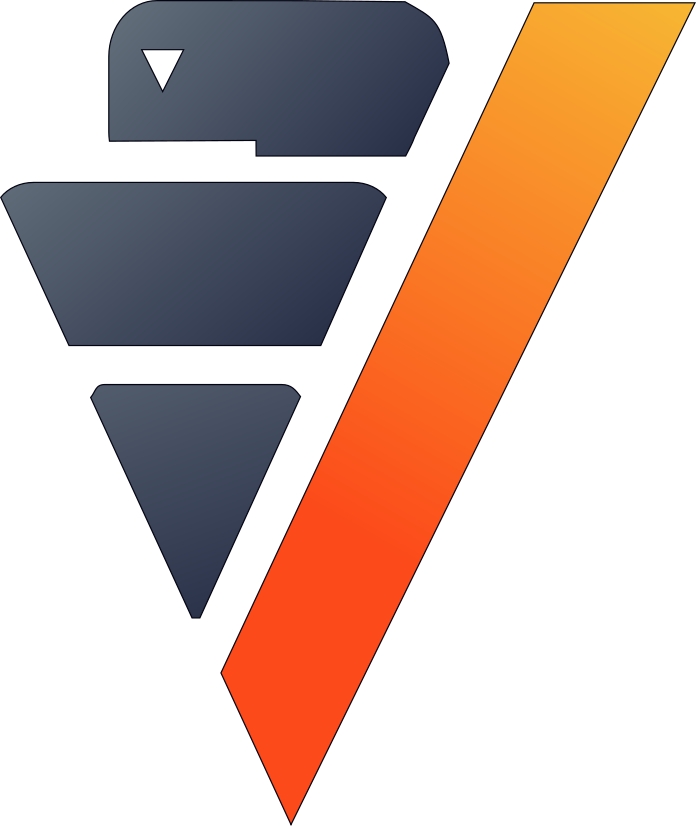

In [18]:
filmtv_movies_complete.describe(method = "all")

We can use the movie's release year to get create three categories.

,123filmtv_idInteger,AbcVarchar(486),"123yearNumeric(8,2)",AbcgenreVarchar(22),AbcVarchar(208),"123avg_voteNumeric(6,2)",123votesInteger,123durationInteger,AbcVarchar(1066),"123notoriety_directorNumeric(34,15)",123castings_directorInteger,"123notoriety_actorsNumeric(34,15)",123castings_actorsInteger,AbcperiodVarchar(6)
1,84957,,1993.0,Animation,,5.8,13,72,,0.00103986135182,4,[null],[null],90s
2,4583,,1979.0,Thriller,,6.0,1,120,,0.018630849220104,80,0.025007624275694,21,Old
3,52224,,2012.0,Thriller,,6.0,2,100,,0.009965337954939,56,0.094642675612484,57,Recent
4,51854,,2012.0,Drama,,6.0,2,88,,8.6655112652e-05,4,0.000406628037004,4,Recent
5,8538,,1992.0,Drama,,5.5,3,135,,0.001906412478336,12,0.675714140489987,98,90s
6,69590,,2008.0,Fantasy,,7.0,2,129,,0.029809358752166,48,0.000711599064756,6,Recent
7,54952,,2012.0,Comedy,,7.3,5,80,,0.000346620450607,4,0.004777879434787,9,Recent
8,20424,,1997.0,Thriller,,6.0,1,96,,0.0,4,0.000101657009251,5,90s
9,34690,,1955.0,Drama,,9.0,1,107,,0.0,4,0.009454101860323,11,Old
10,170537,,2019.0,Comedy,,4.0,7,75,,0.000693240901213,8,0.007217647656806,11,Recent

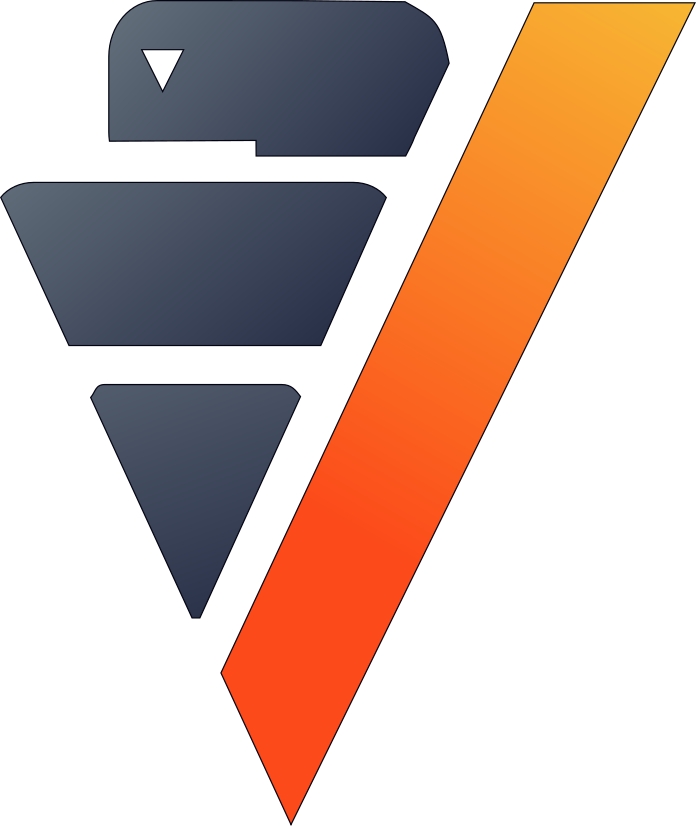

In [19]:
filmtv_movies_complete.case_when('period',
                                 filmtv_movies_complete["year"] < 1990, 'Old',
                                 filmtv_movies_complete["year"] >= 2000, 'Recent', '90s') 

Now, let's look at the countries that made the most movies.

,AbccountryVarchar(208),123COUNTInteger
1,United States,21968
2,Italy,9071
3,France,3045
4,Great Britain,2524
5,Germany,1699
6,Japan,1133
7,Canada,1053
8,Spain,563
9,"Italy, France",403
10,Hong Kong,380

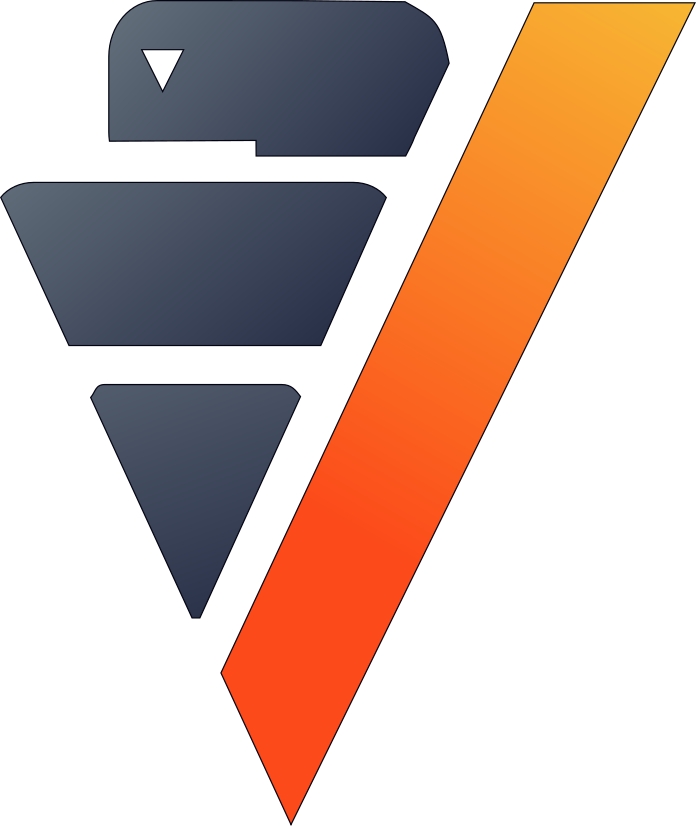

In [20]:
filmtv_movies_complete.groupby(columns = ["country"], 
                               expr = ["COUNT(*)"]).sort(
                               {"count" : "desc"}).head(10)

We can use this variable to create language groups.

,123filmtv_idInteger,AbcVarchar(486),"123yearNumeric(8,2)",AbcgenreVarchar(22),AbcVarchar(208),"123avg_voteNumeric(6,2)",123votesInteger,123durationInteger,AbcVarchar(1066),"123notoriety_directorNumeric(34,15)",123castings_directorInteger,"123notoriety_actorsNumeric(34,15)",123castings_actorsInteger,AbcperiodVarchar(6),Abclanguage_areaVarchar(19)
1,84957,,1993.0,Animation,,5.8,13,72,,0.00103986135182,4,[null],[null],90s,Chinese_Japan_Asian
2,4583,,1979.0,Thriller,,6.0,1,120,,0.018630849220104,80,0.025007624275694,21,Old,English
3,52224,,2012.0,Thriller,,6.0,2,100,,0.009965337954939,56,0.094642675612484,57,Recent,Italian
4,51854,,2012.0,Drama,,6.0,2,88,,8.6655112652e-05,4,0.000406628037004,4,Recent,Spanish_Portuguese
5,8538,,1992.0,Drama,,5.5,3,135,,0.001906412478336,12,0.675714140489987,98,90s,Spanish_Portuguese
6,69590,,2008.0,Fantasy,,7.0,2,129,,0.029809358752166,48,0.000711599064756,6,Recent,Chinese_Japan_Asian
7,54952,,2012.0,Comedy,,7.3,5,80,,0.000346620450607,4,0.004777879434787,9,Recent,Russian_Est_Europe
8,20424,,1997.0,Thriller,,6.0,1,96,,0.0,4,0.000101657009251,5,90s,French
9,34690,,1955.0,Drama,,9.0,1,107,,0.0,4,0.009454101860323,11,Old,Russian_Est_Europe
10,170537,,2019.0,Comedy,,4.0,7,75,,0.000693240901213,8,0.007217647656806,11,Recent,Spanish_Portuguese

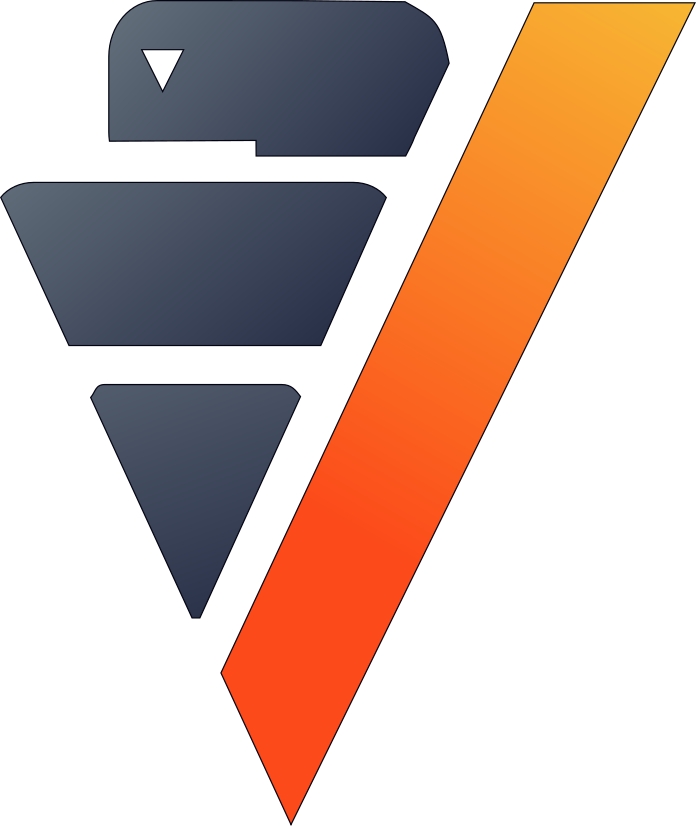

In [22]:
from verticapy import str_sql
# Language Discretization
Arabic_Middle_Est = ["Arab", "Iran", "Turkey", "Egypt", "Tunisia",
                     "Lebanon", "Palestine", "Morocco", "Iraq",
                     "Sudan", "Algeria", "Yemen", "Afghanistan",
                     "Azerbaijan", "Kazakhstan", "Kyrgyzstan",
                     "Kurdistan", "Syria", "Uzbekistan"]
Chinese_Japan_Asian = ["Japan", "Hong Kong", "China", "South Korea", 
                       "Thailand", "Philippines", "Taiwan", "Indonesia",
                       "Singapore", "Malaysia", "Vietnam", "Laos", "Cambodia",
                       "Bhutan"]
Indian = ["India", "Pakistan", "Nepal", "Sri Lanka", "Bangladesh"]
Hebrew = ["Israel"]
Spanish_Portuguese = ["Spain", "Portugal", "Mexico", "Brasil", "Chile",
                      "Argentina", "Colombia", "Cuba", "Venezuela", "Peru",
                      "Uruguay", "Dominican Republic", "Ecuador", "Guatemala",
                      "Costa Rica", "Paraguay", "Bolivia"]
English = ["United States", "England", "Great Britain", "Ireland",
           "Australia", "New Zealand", "South Africa"]
French = ["France", "Canada", "Belgium", "Switzerland", "Luxembourg"]
Italian = ["Italy"]
German_North_Europe = ["German", "Austria", "Holland", "Netherlands", "Denmark",
                       "Norway", "Iceland", "Finland", "Sweden", "Greenland"]
Russian_Est_Europe = ["Russia", "Soviet Union", "Yugoslavia", "Czechoslovakia",
                      "Poland", "Bulgaria", "Croatia", "Czech Republic", "Serbia",
                      "Ukraine", "Slovenia", "Lithuania", "Latvia", "Estonia", 
                      "Bosnia and Herzegovina", "Georgia"]
Grec_Balkan = ["Greece", "Macedonia", "Cyprus", "Romania", "Armenia", "Hungary",
               "Albania", "Malta"]

# Creation of the new feature
filmtv_movies_complete.case_when('language_area', 
        str_sql("REGEXP_LIKE(Country, '{}')".format("|".join(Arabic_Middle_Est))), 'Arabic_Middle_Est',
        str_sql("REGEXP_LIKE(Country, '{}')".format("|".join(Chinese_Japan_Asian))), 'Chinese_Japan_Asian', 
        str_sql("REGEXP_LIKE(Country, '{}')".format("|".join(Indian))), 'Indian', 
        str_sql("REGEXP_LIKE(Country, '{}')".format("|".join(Hebrew))), 'Hebrew', 
        str_sql("REGEXP_LIKE(Country, '{}')".format("|".join(Spanish_Portuguese))), 'Spanish_Portuguese', 
        str_sql("REGEXP_LIKE(Country, '{}')".format("|".join(English))), 'English',
        str_sql("REGEXP_LIKE(Country, '{}')".format("|".join(French))), 'French',
        str_sql("REGEXP_LIKE(Country, '{}')".format("|".join(Italian))), 'Italian',
        str_sql("REGEXP_LIKE(Country, '{}')".format("|".join(German_North_Europe))), 'German_North_Europe',
        str_sql("REGEXP_LIKE(Country, '{}')".format("|".join(Russian_Est_Europe))), 'Russian_Est_Europe',
        str_sql("REGEXP_LIKE(Country, '{}')".format("|".join(Grec_Balkan))), 'Grec_Balkan', 
        'Others') 

We can do the same for the genres.

,123filmtv_idInteger,AbcVarchar(486),"123yearNumeric(8,2)",AbcgenreVarchar(22),AbcVarchar(208),"123avg_voteNumeric(6,2)",123votesInteger,123durationInteger,AbcVarchar(1066),"123notoriety_directorNumeric(34,15)",123castings_directorInteger,"123notoriety_actorsNumeric(34,15)",123castings_actorsInteger,AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9)
1,84957,,1993.0,Animation,,5.8,13,72,,0.00103986135182,4,[null],[null],90s,Chinese_Japan_Asian,Animation
2,4583,,1979.0,Thriller,,6.0,1,120,,0.018630849220104,80,0.025007624275694,21,Old,English,Thriller
3,52224,,2012.0,Thriller,,6.0,2,100,,0.009965337954939,56,0.094642675612484,57,Recent,Italian,Thriller
4,51854,,2012.0,Drama,,6.0,2,88,,8.6655112652e-05,4,0.000406628037004,4,Recent,Spanish_Portuguese,Drama
5,8538,,1992.0,Drama,,5.5,3,135,,0.001906412478336,12,0.675714140489987,98,90s,Spanish_Portuguese,Drama
6,69590,,2008.0,Fantasy,,7.0,2,129,,0.029809358752166,48,0.000711599064756,6,Recent,Chinese_Japan_Asian,Fantasy
7,54952,,2012.0,Comedy,,7.3,5,80,,0.000346620450607,4,0.004777879434787,9,Recent,Russian_Est_Europe,Comedy
8,20424,,1997.0,Thriller,,6.0,1,96,,0.0,4,0.000101657009251,5,90s,French,Thriller
9,34690,,1955.0,Drama,,9.0,1,107,,0.0,4,0.009454101860323,11,Old,Russian_Est_Europe,Drama
10,170537,,2019.0,Comedy,,4.0,7,75,,0.000693240901213,8,0.007217647656806,11,Recent,Spanish_Portuguese,Comedy

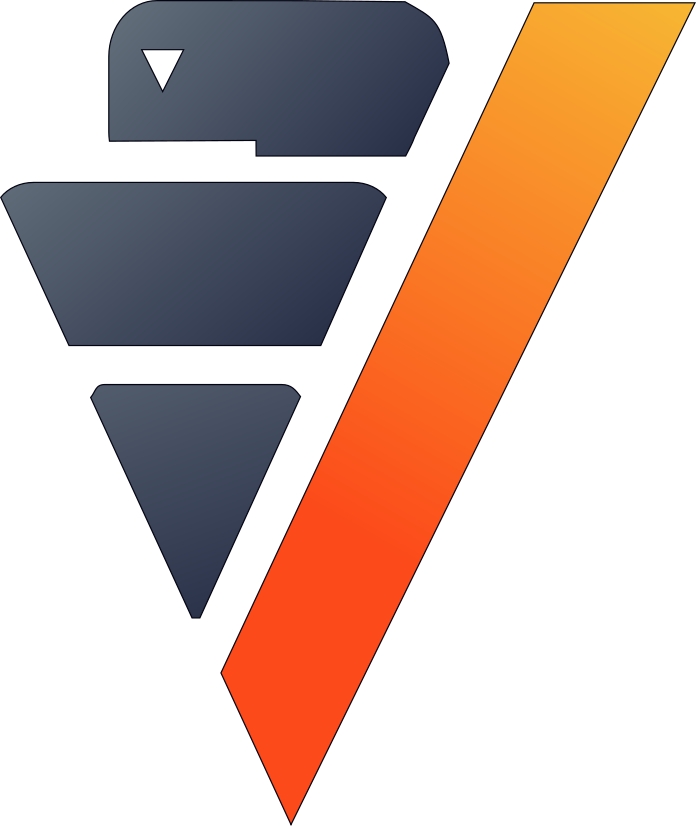

In [23]:
filmtv_movies_complete.case_when(
         'Category', 
         str_sql("REGEXP_LIKE(Genre, 'Drama|Noir')"), 'Drama', 
         str_sql("REGEXP_LIKE(Genre, 'Comedy|Grotesque')"), 'Comedy', 
         str_sql("REGEXP_LIKE(Genre, 'Fantasy|Super-hero')"), 'Fantasy', 
         str_sql("REGEXP_LIKE(Genre, 'Romantic|Sperimental|Mélo')"), 'Romantic', 
         str_sql("REGEXP_LIKE(Genre, 'Thriller|Crime|Gangster')"), 'Thriller', 
         str_sql("REGEXP_LIKE(Genre, 'Action|Western|War|Spy')"), 'Action', 
         str_sql("REGEXP_LIKE(Genre, 'Adventure')"), 'Adventure', 
         str_sql("REGEXP_LIKE(Genre, 'Animation')"), 'Animation', 
         str_sql("REGEXP_LIKE(Genre, 'Horror')"), 'Horror', 
         'Others') 

Since we're more concerned with the 'Category' at this point, we can drop 'genre.'

,123filmtv_idInteger,AbcVarchar(486),"123yearNumeric(8,2)",AbcVarchar(208),"123avg_voteNumeric(6,2)",123votesInteger,123durationInteger,AbcVarchar(1066),"123notoriety_directorNumeric(34,15)",123castings_directorInteger,"123notoriety_actorsNumeric(34,15)",123castings_actorsInteger,AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9)
1,84957,,1993.0,,5.8,13,72,,0.00103986135182,4,[null],[null],90s,Chinese_Japan_Asian,Animation
2,4583,,1979.0,,6.0,1,120,,0.018630849220104,80,0.025007624275694,21,Old,English,Thriller
3,52224,,2012.0,,6.0,2,100,,0.009965337954939,56,0.094642675612484,57,Recent,Italian,Thriller
4,51854,,2012.0,,6.0,2,88,,8.6655112652e-05,4,0.000406628037004,4,Recent,Spanish_Portuguese,Drama
5,8538,,1992.0,,5.5,3,135,,0.001906412478336,12,0.675714140489987,98,90s,Spanish_Portuguese,Drama
6,69590,,2008.0,,7.0,2,129,,0.029809358752166,48,0.000711599064756,6,Recent,Chinese_Japan_Asian,Fantasy
7,54952,,2012.0,,7.3,5,80,,0.000346620450607,4,0.004777879434787,9,Recent,Russian_Est_Europe,Comedy
8,20424,,1997.0,,6.0,1,96,,0.0,4,0.000101657009251,5,90s,French,Thriller
9,34690,,1955.0,,9.0,1,107,,0.0,4,0.009454101860323,11,Old,Russian_Est_Europe,Drama
10,170537,,2019.0,,4.0,7,75,,0.000693240901213,8,0.007217647656806,11,Recent,Spanish_Portuguese,Comedy

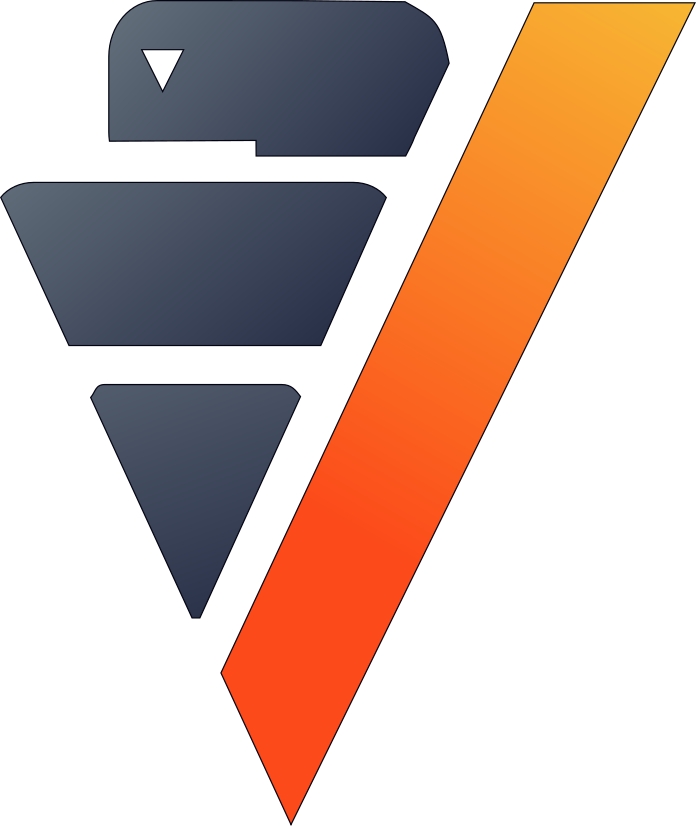

In [24]:
filmtv_movies_complete.drop(columns = ["genre"])

Let's look at the missing values.

,count,percent
"""filmtv_id""",53397.0,100.0
"""avg_vote""",53397.0,100.0
"""votes""",53397.0,100.0
"""duration""",53397.0,100.0
"""period""",53397.0,100.0
"""language_area""",53397.0,100.0
"""Category""",53397.0,100.0
"""title""",53395.0,99.996
"""year""",53387.0,99.981
"""country""",53346.0,99.904

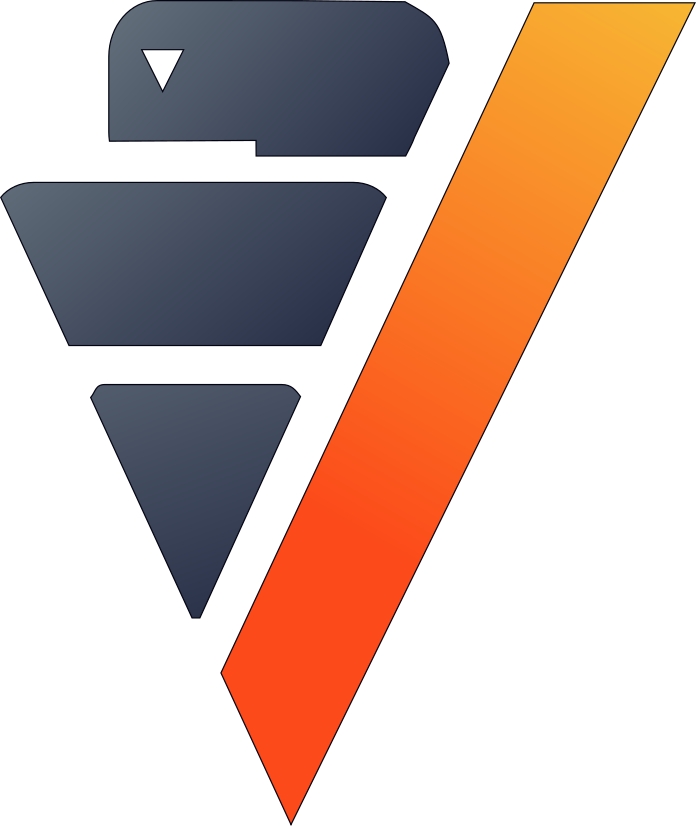

In [25]:
filmtv_movies_complete.count_percent()

Let's impute the missing values for 'notoriety_actors' and 'castings_actors' using different techniques. We can then drop the few remaining missing values.

640 elements were filled.
640 elements were filled.
2499 elements were filtered.


,123filmtv_idInteger,AbcVarchar(486),"123yearNumeric(8,2)",AbccountryVarchar(208),"123avg_voteNumeric(6,2)",123votesInteger,123durationInteger,AbcVarchar(1066),"123notoriety_directorNumeric(34,15)",123castings_directorInteger,123notoriety_actorsFloat,123castings_actorsFloat,AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9)
1,80684,,2015.0,United States,4.0,5,86,,0.000346620450607,4,0.016163464470875,21.0,Recent,English,Action
2,56292,,2012.0,India,8.0,1,150,,8.6655112652e-05,8,0.000101657009251,5.0,Recent,Indian,Action
3,63738,,2008.0,India,8.0,1,183,,8.6655112652e-05,8,0.002338111212768,9.0,Recent,Indian,Action
4,49021,,2011.0,United States,3.9,39,108,,0.003292894280763,4,0.885025922537358,95.0,Recent,English,Action
5,17196,,1985.0,United States,4.0,1,90,,0.00155979202773,16,0.196502998881773,55.0,Old,English,Action
6,1644,,1988.0,United States,4.9,7,100,,0.008838821490468,44,0.016570092507878,29.0,Old,English,Action
7,23470,,1995.0,United States,5.2,7,86,,0.008838821490468,44,0.043204228931586,47.0,90s,English,Action
8,77190,,1997.0,United States,5.5,2,97,,0.008838821490468,44,0.048388736403376,68.0,90s,English,Action
9,11387,,1993.0,United States,3.7,21,100,,0.008838821490468,44,0.050523533597643,60.0,90s,English,Action
10,78243,,2001.0,United States,5.5,2,90,,0.008838821490468,44,0.051031818643896,75.0,Recent,English,Action

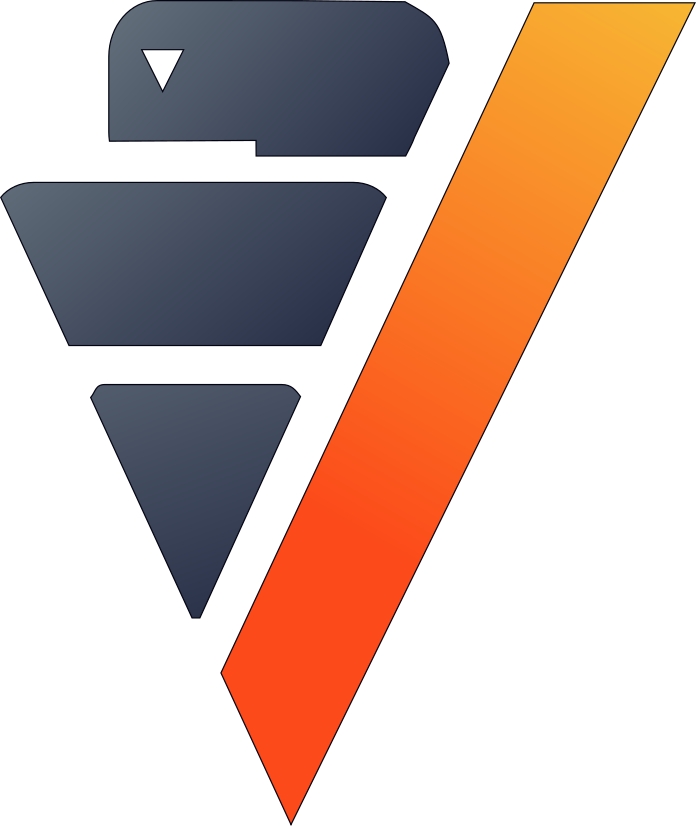

In [26]:
filmtv_movies_complete["notoriety_actors"].fillna(method = "median",
                                                  by = ["director",
                                                        "Category"])
filmtv_movies_complete["castings_actors"].fillna(method = "median",
                                                 by = ["director",
                                                       "Category"])
filmtv_movies_complete.dropna()

Before we export the data, we should normalize the numerical columns to get the dummies of the different categories.

In [27]:
filmtv_movies_complete.normalize(method = "minmax",
                                 columns = ['votes', 
                                            'duration', 
                                            'notoriety_director',
                                            'castings_director',
                                            'notoriety_actors',
                                            'castings_actors'])
for elem in ['category', 'period', 'language_area']:
    filmtv_movies_complete[elem].get_dummies(drop_first = True)

We can export the results to our Vertica database.

,123filmtv_idInt,AbcVarchar(486),"123yearNumeric(8,2)",AbccountryVarchar(208),"123avg_voteNumeric(6,2)","123votesNumeric(34,15)","123durationNumeric(34,15)",AbcdirectorVarchar(1066),"123notoriety_directorNumeric(37,17)","123castings_directorNumeric(34,15)",123notoriety_actorsFloat,123castings_actorsFloat,AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9),123Category_ActionInt,123Category_AdventureInt,123Category_AnimationInt,123Category_ComedyInt,123Category_DramaInt,123Category_FantasyInt,123Category_HorrorInt,123Category_OthersInt,123Category_RomanticInt,123period_90sInt,123period_OldInt,123language_area_Arabic_Middle_EstInt,123Int,123language_area_EnglishInt,123language_area_FrenchInt,123Int,123language_area_Grec_BalkanInt,123language_area_HebrewInt,123language_area_IndianInt,123language_area_ItalianInt,123language_area_OthersInt,123language_area_Russian_Est_EuropeInt
1,18,,1982.0,United States,7.2,0.011466011466011,0.010496183206107,Barry Levinson,0.189774696707106,0.347222222222222,0.162088287549542,0.300751879699248,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0
2,22,,1967.0,Italy,7.8,0.082719082719083,0.010114503816794,Elio Petri,0.1078856152513,0.152777777777778,0.248690264680425,0.537593984962406,Old,Italian,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0
3,24,,1966.0,Italy,6.5,0.001638001638002,0.00763358778626,Ray Morrison (Angelo Dorigo),0.000173310225303,0.0,0.00332558881144434,0.0676691729323308,Old,Italian,Thriller,0,0,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0
4,30,,1968.0,Italy,5.5,0.000819000819001,0.011641221374046,Leon Klimovsky,0.004679376083189,0.138888888888889,0.0165368320349875,0.154135338345865,Old,Italian,Adventure,0,1,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0
5,31,,1990.0,United States,4.0,0.0,0.009541984732824,Carol Wiseman,0.000433275563258,0.027777777777778,0.00560338936722661,0.0676691729323308,90s,English,Comedy,0,0,0,1,0,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0
6,32,,1990.0,United States,5.1,0.086814086814087,0.010687022900763,Joseph Ruben,0.037781629116118,0.166666666666667,0.12332012209011,0.184210526315789,90s,English,Drama,0,0,0,0,1,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0
7,33,,1991.0,United States,8.0,0.000819000819001,0.011450381679389,Brian Grant,0.000693240901213,0.055555555555556,0.0127556831123869,0.0977443609022556,90s,English,Thriller,0,0,0,0,0,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0
8,37,,1975.0,Italy,5.9,0.033579033579034,0.011450381679389,Marcello Fondato,0.031542461005199,0.097222222222222,0.338754498656099,0.575187969924812,Old,Italian,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0
9,41,,1985.0,France,4.0,0.0,0.013358778625954,Vera Belmont,0.003206239168111,0.027777777777778,0.0932075987426543,0.266917293233083,Old,French,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,1,,0,0,0,0,0,0
10,42,,1988.0,Hungary,8.0,0.0,0.013358778625954,Géza Beremenyi,0.0,0.0,0.000364448088925199,0.0225563909774436,Old,Grec_Balkan,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,0,,1,0,0,0,0,0

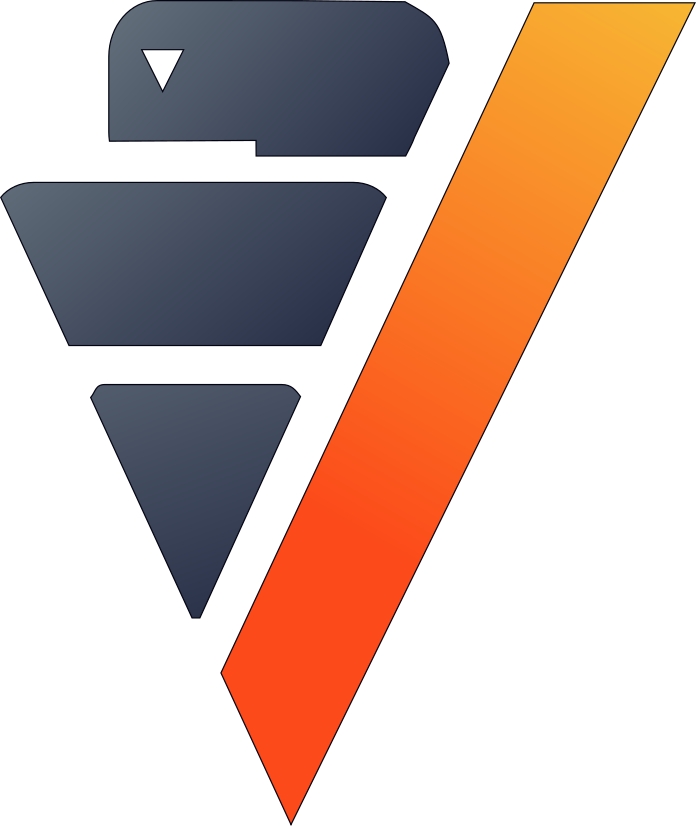

In [29]:
vp.drop("filmtv_movies_complete", relation_type = "table")
filmtv_movies_complete.to_db(name = "filmtv_movies_complete",
                             relation_type = "table",
                             inplace = True)
vp.drop("filmtv_movies_mco", relation_type ="table")
filmtv_movies_complete.to_db(name = "filmtv_movies_mco",
                             relation_type = "view",
                             db_filter = "votes > 0.02")

# Machine Learning : Adjusting the Films Rates

Let's create a model to evaluate an unbiased score for each different movie.

,value
explained_variance,0.464270241400127
max_error,4.90514454422644
median_absolute_error,0.594656560035703
mean_absolute_error,0.715790513947802
mean_squared_error,0.8320337597516
root_mean_squared_error,0.9121588456796327
r2,0.464270241396865
r2_adj,0.4627609968855486
aic,-1838.2197712669765
bic,-1621.1336797755434

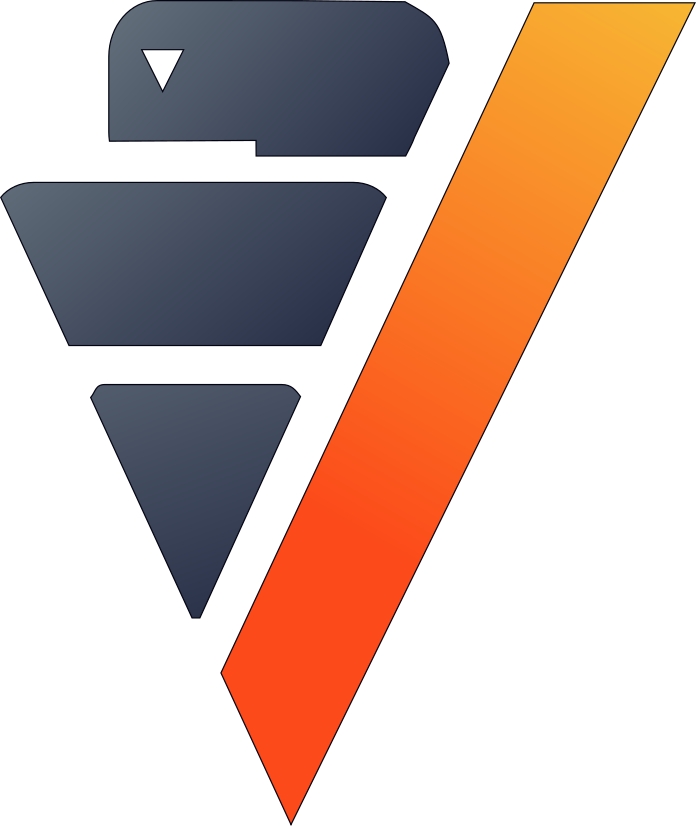

In [30]:
from verticapy.learn.linear_model import LinearRegression
predictors = filmtv_movies_complete.get_columns(
                            exclude_columns = ["avg_vote",
                                               "period",
                                               "director",
                                               "language_area",
                                               "title", 
                                               "year",
                                               "country",
                                               "Category"])
model = LinearRegression("filmtv_movies_lr",
                         max_iter = 1000,
                         solver = "BFGS")
model.fit("filmtv_movies_mco", predictors, "avg_vote")
model.report()

The model is good. Let's add it in our vDataFrame.

,123filmtv_idInt,AbcVarchar(486),"123yearNumeric(8,2)",AbccountryVarchar(208),"123avg_voteNumeric(6,2)","123votesNumeric(34,15)","123durationNumeric(34,15)",AbcdirectorVarchar(1066),"123notoriety_directorNumeric(37,17)","123castings_directorNumeric(34,15)",123notoriety_actorsFloat,123castings_actorsFloat,AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9),123Category_ActionInt,123Category_AdventureInt,123Category_AnimationInt,123Category_ComedyInt,123Category_DramaInt,123Category_FantasyInt,123Category_HorrorInt,123Category_OthersInt,123Category_RomanticInt,123period_90sInt,123period_OldInt,123language_area_Arabic_Middle_EstInt,123Int,123language_area_EnglishInt,123language_area_FrenchInt,123Int,123language_area_Grec_BalkanInt,123language_area_HebrewInt,123language_area_IndianInt,123language_area_ItalianInt,123language_area_OthersInt,123language_area_Russian_Est_EuropeInt,123unbiased_voteFloat
1,18,,1982.0,United States,7.2,0.011466011466011,0.010496183206107,Barry Levinson,0.189774696707106,0.347222222222222,0.162088287549542,0.300751879699248,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,6.52246085416833
2,22,,1967.0,Italy,7.8,0.082719082719083,0.010114503816794,Elio Petri,0.1078856152513,0.152777777777778,0.248690264680425,0.537593984962406,Old,Italian,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,6.89722439072369
3,24,,1966.0,Italy,6.5,0.001638001638002,0.00763358778626,Ray Morrison (Angelo Dorigo),0.000173310225303,0.0,0.00332558881144434,0.0676691729323308,Old,Italian,Thriller,0,0,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,6.1147551680886
4,30,,1968.0,Italy,5.5,0.000819000819001,0.011641221374046,Leon Klimovsky,0.004679376083189,0.138888888888889,0.0165368320349875,0.154135338345865,Old,Italian,Adventure,0,1,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,5.90043279453199
5,31,,1990.0,United States,4.0,0.0,0.009541984732824,Carol Wiseman,0.000433275563258,0.027777777777778,0.00560338936722661,0.0676691729323308,90s,English,Comedy,0,0,0,1,0,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0,5.79999345309649
6,32,,1990.0,United States,5.1,0.086814086814087,0.010687022900763,Joseph Ruben,0.037781629116118,0.166666666666667,0.12332012209011,0.184210526315789,90s,English,Drama,0,0,0,0,1,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0,6.8641383448391
7,33,,1991.0,United States,8.0,0.000819000819001,0.011450381679389,Brian Grant,0.000693240901213,0.055555555555556,0.0127556831123869,0.0977443609022556,90s,English,Thriller,0,0,0,0,0,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0,5.98371771993834
8,37,,1975.0,Italy,5.9,0.033579033579034,0.011450381679389,Marcello Fondato,0.031542461005199,0.097222222222222,0.338754498656099,0.575187969924812,Old,Italian,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,5.86908191508032
9,41,,1985.0,France,4.0,0.0,0.013358778625954,Vera Belmont,0.003206239168111,0.027777777777778,0.0932075987426543,0.266917293233083,Old,French,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,1,,0,0,0,0,0,0,7.49908608478976
10,42,,1988.0,Hungary,8.0,0.0,0.013358778625954,Géza Beremenyi,0.0,0.0,0.000364448088925199,0.0225563909774436,Old,Grec_Balkan,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,0,,1,0,0,0,0,0,8.10341147020175

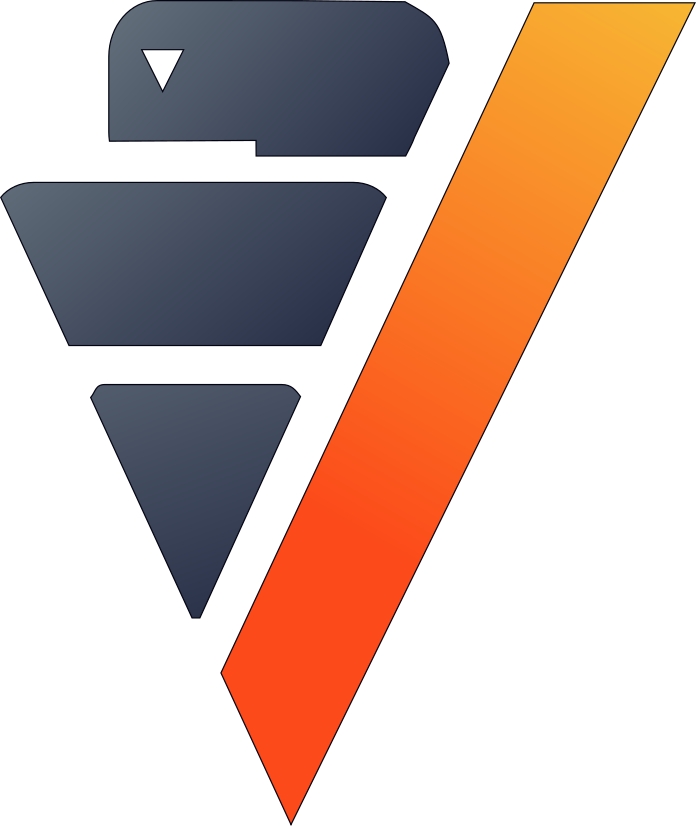

In [31]:
model.predict(filmtv_movies_complete,
              name = "unbiased_vote")

Since a score can't be greater than 10 or less than 0, we need to adjust the 'unbiased_vote.'

In [32]:
filmtv_movies_complete["unbiased_vote"] = st.case_when(filmtv_movies_complete["unbiased_vote"] > 10, 10,
                                                       filmtv_movies_complete["unbiased_vote"] < 0, 0,
                                                       filmtv_movies_complete["unbiased_vote"])

Let's look at the top movies.

,123filmtv_idInteger,AbcVarchar(486),"123yearNumeric(8,2)",AbccountryVarchar(208),"123avg_voteNumeric(6,2)",123unbiased_voteFloat,"123votesNumeric(34,15)","123durationNumeric(34,15)",AbcdirectorVarchar(1066),"123notoriety_directorNumeric(37,17)","123castings_directorNumeric(34,15)",123notoriety_actorsFloat,123castings_actorsFloat,AbcperiodVarchar(6),Abclanguage_areaVarchar(19)
1,27984,,1992.0,Germany,9.3,10.0,0.013923013923014,0.283396946564885,Edgar Reitz,0.04107452339688,0.541666666666667,0.0191790806796959,0.203007518796992,90s,German_North_Europe
2,5580,,1960.0,United States,9.3,10.0,0.645372645372645,0.012977099236641,Alfred Hitchcock,0.753379549393414,0.708333333333333,0.245501343902328,0.334586466165414,Old,English
3,17065,,1971.0,Great Britain,9.2,10.0,0.889434889434889,0.018511450381679,Stanley Kubrick,0.649913344887348,0.152777777777778,0.254658102136577,0.150375939849624,Old,English
4,1963,,1968.0,Great Britain,9.1,10.0,0.806715806715807,0.019274809160305,Stanley Kubrick,0.649913344887348,0.152777777777778,0.138809165869436,0.0413533834586466,Old,English
5,4991,,1972.0,United States,9.1,10.0,0.684684684684685,0.026335877862595,Francis Ford Coppola,0.4342287694974,0.347222222222222,0.566671222267779,0.492481203007519,Old,English
6,6476,,1980.0,"United States, Great Britain",9.1,10.0,0.955773955773956,0.015076335877863,Stanley Kubrick,0.649913344887348,0.152777777777778,0.415789713452691,0.169172932330827,Old,English
7,7025,,1976.0,United States,9.1,10.0,0.709254709254709,0.013358778625954,Martin Scorsese,0.829289428076256,0.472222222222222,0.832809439205505,0.586466165413534,Old,English
8,27983,,1984.0,Germany,9.0,10.0,0.033579033579034,0.168702290076336,Edgar Reitz,0.04107452339688,0.541666666666667,0.0119812309234203,0.0413533834586466,Old,German_North_Europe
9,1152,,1984.0,United States,9.0,10.0,0.665028665028665,0.034351145038168,Sergio Leone,0.290467937608319,0.083333333333333,0.667304450822288,0.421052631578947,Old,English
10,12849,,1994.0,United States,9.0,10.0,1.0,0.02175572519084,Quentin Tarantino,0.686741767764298,0.125,0.865928659286594,0.541353383458647,90s,English

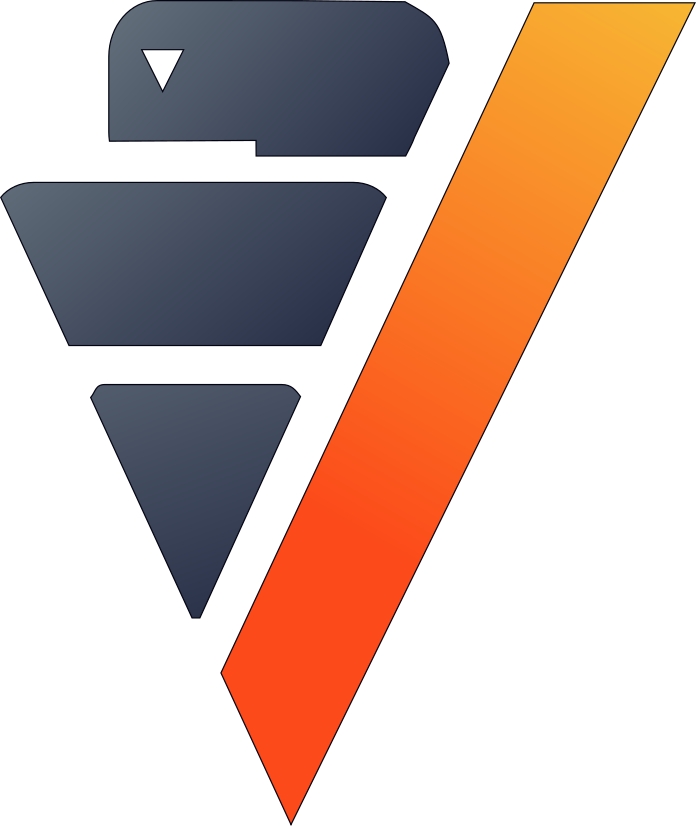

In [33]:
filmtv_movies_complete.search(usecols = ['filmtv_id',
                                         'title',
                                         'year',
                                         'country',
                                         'avg_vote',
                                         'unbiased_vote',
                                         'votes',
                                         'duration',
                                         'director',
                                         'notoriety_director',
                                         'castings_director',
                                         'notoriety_actors',
                                         'castings_actors',
                                         'period',
                                         'language_area'],
                              order_by = {"unbiased_vote" : "desc", 
                                          "avg_vote" : "desc"}).head(10)

Great, our results are more consistent. Psycho, Pulp Fiction, and The Godfather are among the top movies.

# Machine Learning : Creating Movie Clusters

Since k-means clustering is sensitive to unnormalized data, let's normalize our new predictors.

,123filmtv_idInt,AbcVarchar(486),"123yearNumeric(8,2)",AbccountryVarchar(208),"123avg_voteNumeric(6,2)","123votesNumeric(34,15)","123durationNumeric(34,15)",AbcdirectorVarchar(1066),"123notoriety_directorNumeric(37,17)","123castings_directorNumeric(34,15)",123notoriety_actorsFloat,123castings_actorsFloat,AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9),123Category_ActionInt,123Category_AdventureInt,123Category_AnimationInt,123Category_ComedyInt,123Category_DramaInt,123Category_FantasyInt,123Category_HorrorInt,123Category_OthersInt,123Category_RomanticInt,123period_90sInt,123period_OldInt,123language_area_Arabic_Middle_EstInt,123Int,123language_area_EnglishInt,123language_area_FrenchInt,123Int,123language_area_Grec_BalkanInt,123language_area_HebrewInt,123language_area_IndianInt,123language_area_ItalianInt,123language_area_OthersInt,123language_area_Russian_Est_EuropeInt,123unbiased_voteFloat
1,18,,1982.0,United States,7.2,0.011466011466011,0.010496183206107,Barry Levinson,0.189774696707106,0.347222222222222,0.162088287549542,0.300751879699248,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,0.398460883105255
2,22,,1967.0,Italy,7.8,0.082719082719083,0.010114503816794,Elio Petri,0.1078856152513,0.152777777777778,0.248690264680425,0.537593984962406,Old,Italian,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.463286875673614
3,24,,1966.0,Italy,6.5,0.001638001638002,0.00763358778626,Ray Morrison (Angelo Dorigo),0.000173310225303,0.0,0.00332558881144434,0.0676691729323308,Old,Italian,Thriller,0,0,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.327936610603151
4,30,,1968.0,Italy,5.5,0.000819000819001,0.011641221374046,Leon Klimovsky,0.004679376083189,0.138888888888889,0.0165368320349875,0.154135338345865,Old,Italian,Adventure,0,1,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.290863471836457
5,31,,1990.0,United States,4.0,0.0,0.009541984732824,Carol Wiseman,0.000433275563258,0.027777777777778,0.00560338936722661,0.0676691729323308,90s,English,Comedy,0,0,0,1,0,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0,0.273489636427294
6,32,,1990.0,United States,5.1,0.086814086814087,0.010687022900763,Joseph Ruben,0.037781629116118,0.166666666666667,0.12332012209011,0.184210526315789,90s,English,Drama,0,0,0,0,1,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0,0.45756370477939
7,33,,1991.0,United States,8.0,0.000819000819001,0.011450381679389,Brian Grant,0.000693240901213,0.055555555555556,0.0127556831123869,0.0977443609022556,90s,English,Thriller,0,0,0,0,0,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0,0.305269964007691
8,37,,1975.0,Italy,5.9,0.033579033579034,0.011450381679389,Marcello Fondato,0.031542461005199,0.097222222222222,0.338754498656099,0.575187969924812,Old,Italian,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.285440447235329
9,41,,1985.0,France,4.0,0.0,0.013358778625954,Vera Belmont,0.003206239168111,0.027777777777778,0.0932075987426543,0.266917293233083,Old,French,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,1,,0,0,0,0,0,0,0.567395941527047
10,42,,1988.0,Hungary,8.0,0.0,0.013358778625954,Géza Beremenyi,0.0,0.0,0.000364448088925199,0.0225563909774436,Old,Grec_Balkan,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,0,,1,0,0,0,0,0,0.671931172738907

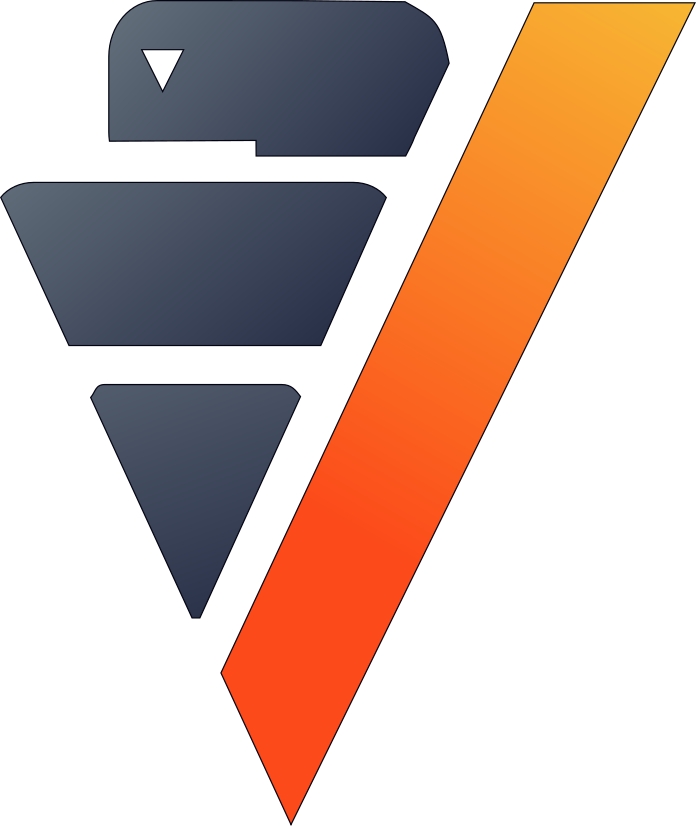

In [34]:
filmtv_movies_complete["unbiased_vote"].normalize(method = "minmax")

Let's compute the elbow curve to find a suitable number of clusters.

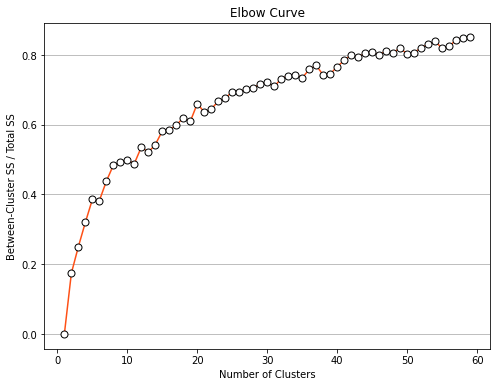

In [35]:
%matplotlib inline
predictors = filmtv_movies_complete.get_columns(
                        exclude_columns = ["avg_vote",
                                           "period",
                                           "director",
                                           "language_area",
                                           "title", 
                                           "year",
                                           "country",
                                           "Category",
                                           "filmtv_id"])
from verticapy.learn.model_selection import elbow
elbow = elbow(filmtv_movies_complete,
              predictors,
              n_cluster = (1, 60))

By looking at the elbow curve, we can choose 15 clusters. Let's create a k-means model.

,123votesFloat,123durationFloat,123notoriety_directorFloat,123castings_directorFloat,123notoriety_actorsFloat,123castings_actorsFloat,123category_actionFloat,123category_adventureFloat,123category_animationFloat,123category_comedyFloat,123category_dramaFloat,123category_fantasyFloat,123category_horrorFloat,123category_othersFloat,123category_romanticFloat,123period_90sFloat,123period_oldFloat,123language_area_arabic_middle_estFloat,123Float,123language_area_englishFloat,123language_area_frenchFloat,123Float,123language_area_grec_balkanFloat,123language_area_hebrewFloat,123language_area_indianFloat,123language_area_italianFloat,123language_area_othersFloat,123language_area_russian_est_europeFloat,123unbiased_voteFloat
1,0.0116392274743685,0.0117303281945985,0.0176309789208149,0.11140485659195,0.0325306976858635,0.109275357591375,0.797180043383948,0.022234273318872,0.0276572668112798,0.0189804772234273,0.0,0.0206073752711497,0.0135574837310195,0.0,0.0216919739696312,0.0629067245119306,0.579175704989154,0.00704989154013015,,0.0,0.0,,0.00216919739696312,0.00379609544468547,0.00867678958785249,0.280368763557484,0.00108459869848156,0.0200650759219089,0.395241220781011
2,0.0133591535460695,0.0122886844685794,0.019130739809489,0.0993245169303444,0.0310507834986929,0.0812063143014215,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.103536741799524,0.31170973062122,0.0586402785413231,,0.0,0.431006047278725,,0.021073850100788,0.0164925783397471,0.0216236027121129,0.0,0.00366501740883269,0.0729338464357706,0.480102660065179
3,0.0274087488264318,0.0111279760519456,0.036966826679207,0.171779725609756,0.101352332967774,0.198210847240051,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.581935975609756,0.0,,1.0,0.0,,0.0,0.0,0.0,0.0,0.0,0.0,0.324079043275173
4,0.0285391057828527,0.011004777076025,0.0310521095143829,0.0804145550651191,0.0942682785227941,0.128748796955606,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0269740068661108,0.0,0.00931829328102011,,0.617949975478176,0.0,,0.0051495831289848,0.00294261893084846,0.0100539480137322,0.228052967140755,0.000490436488474743,0.0102991662579696,0.201641798894054
5,0.0154215492702747,0.0106528105192306,0.0423787498343305,0.192746784603241,0.0677887628112481,0.17818025004006,0.0,0.197241955704137,0.00125365649811952,0.537609694943585,0.0,0.0,0.0,0.0,0.0549519431675721,0.0,1.0,0.00313414124529879,,0.935018804847472,0.0,,0.00167154199749269,0.000835770998746344,0.000626828249059758,0.0,0.000208942749686586,0.0156707062264939,0.425606752690683
6,0.0120416773846377,0.0117309918152506,0.0268975905499002,0.112299438427597,0.0442525993651434,0.0834796829619174,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0162454873646209,0.276534296028881,0.0115523465703971,,0.622021660649819,0.0,,0.00252707581227437,0.00613718411552347,0.00794223826714801,0.218772563176895,0.0,0.0277978339350181,0.384155762017873
7,0.0619781528872438,0.0118967758280735,0.0571392308827318,0.110519881353215,0.114052464879307,0.144395078605605,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.211399711399711,0.337662337662338,0.0,,0.908369408369408,0.0,,0.000721500721500722,0.00216450216450216,0.00144300144300144,0.0,0.0,0.0209235209235209,0.2942218687305
8,0.023984895153917,0.0119409472149102,0.0398913606649718,0.1508890520177,0.0945264323057784,0.165601883217863,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.508533675903836,0.0,,1.0,0.0,,0.0,0.0,0.0,0.0,0.0,0.0,0.432845560624058
9,0.020609022145979,0.01116946842199,0.0292659874868903,0.116919333053887,0.0909735337398087,0.158390597143971,0.0835545619673047,0.0713986307111918,0.0118764845605701,0.170462484281123,0.222998463043175,0.0,0.0,0.0226351823389688,0.047086768198966,0.725723068324717,0.0,0.00055889339108565,,0.994411066089144,0.0,,0.000139723347771413,0.000139723347771413,0.000139723347771413,0.0,0.0,0.000419170043314238,0.305250807714019
10,0.012195417600823,0.0109650544765048,0.04604386510799,0.191745316745317,0.02026717750375,0.0693577573276821,0.0411840411840412,0.0283140283140283,0.0,0.150579150579151,0.489060489060489,0.0141
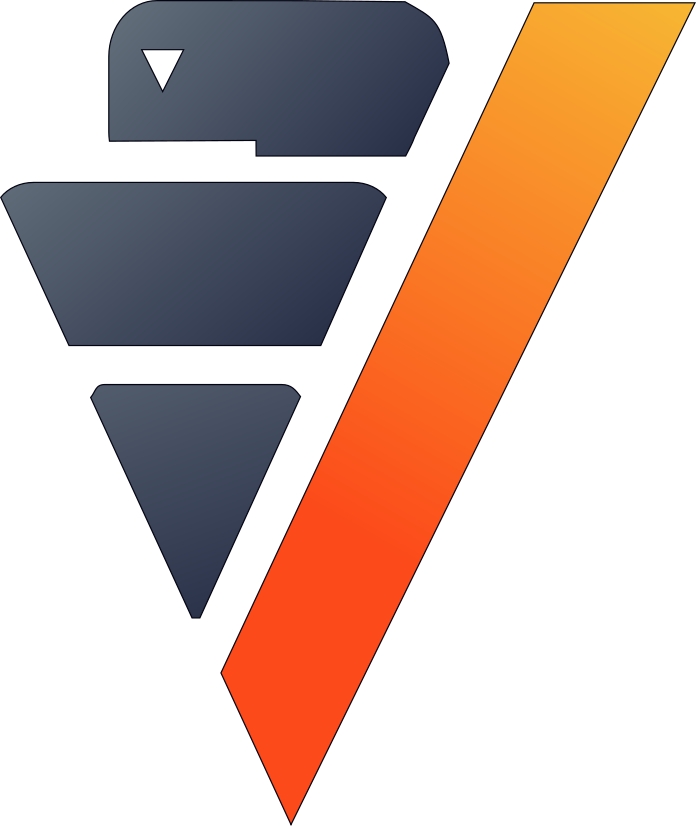

In [36]:
from verticapy.learn.cluster import KMeans
model_kmeans = KMeans("filmtv_movies_clustering", n_cluster = 15)
model_kmeans.fit(filmtv_movies_complete, predictors)
model_kmeans.cluster_centers_

Let's add the clusters in the vDataFrame.

,123filmtv_idInt,AbcVarchar(486),"123yearNumeric(8,2)",AbccountryVarchar(208),"123avg_voteNumeric(6,2)","123votesNumeric(34,15)","123durationNumeric(34,15)",AbcdirectorVarchar(1066),"123notoriety_directorNumeric(37,17)","123castings_directorNumeric(34,15)",123notoriety_actorsFloat,123castings_actorsFloat,AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9),123Category_ActionInt,123Category_AdventureInt,123Category_AnimationInt,123Category_ComedyInt,123Category_DramaInt,123Category_FantasyInt,123Category_HorrorInt,123Category_OthersInt,123Category_RomanticInt,123period_90sInt,123period_OldInt,123language_area_Arabic_Middle_EstInt,123Int,123language_area_EnglishInt,123language_area_FrenchInt,123Int,123language_area_Grec_BalkanInt,123language_area_HebrewInt,123language_area_IndianInt,123language_area_ItalianInt,123language_area_OthersInt,123language_area_Russian_Est_EuropeInt,123unbiased_voteFloat,123movies_clusterInteger
1,18,,1982.0,United States,7.2,0.011466011466011,0.010496183206107,Barry Levinson,0.189774696707106,0.347222222222222,0.162088287549542,0.300751879699248,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,0.398460883105255,4
2,22,,1967.0,Italy,7.8,0.082719082719083,0.010114503816794,Elio Petri,0.1078856152513,0.152777777777778,0.248690264680425,0.537593984962406,Old,Italian,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.463286875673614,12
3,24,,1966.0,Italy,6.5,0.001638001638002,0.00763358778626,Ray Morrison (Angelo Dorigo),0.000173310225303,0.0,0.00332558881144434,0.0676691729323308,Old,Italian,Thriller,0,0,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.327936610603151,12
4,30,,1968.0,Italy,5.5,0.000819000819001,0.011641221374046,Leon Klimovsky,0.004679376083189,0.138888888888889,0.0165368320349875,0.154135338345865,Old,Italian,Adventure,0,1,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.290863471836457,12
5,31,,1990.0,United States,4.0,0.0,0.009541984732824,Carol Wiseman,0.000433275563258,0.027777777777778,0.00560338936722661,0.0676691729323308,90s,English,Comedy,0,0,0,1,0,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0,0.273489636427294,8
6,32,,1990.0,United States,5.1,0.086814086814087,0.010687022900763,Joseph Ruben,0.037781629116118,0.166666666666667,0.12332012209011,0.184210526315789,90s,English,Drama,0,0,0,0,1,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0,0.45756370477939,8
7,33,,1991.0,United States,8.0,0.000819000819001,0.011450381679389,Brian Grant,0.000693240901213,0.055555555555556,0.0127556831123869,0.0977443609022556,90s,English,Thriller,0,0,0,0,0,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0,0.305269964007691,8
8,37,,1975.0,Italy,5.9,0.033579033579034,0.011450381679389,Marcello Fondato,0.031542461005199,0.097222222222222,0.338754498656099,0.575187969924812,Old,Italian,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.285440447235329,12
9,41,,1985.0,France,4.0,0.0,0.013358778625954,Vera Belmont,0.003206239168111,0.027777777777778,0.0932075987426543,0.266917293233083,Old,French,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,1,,0,0,0,0,0,0,0.567395941527047,1
10,42,,1988.0,Hungary,8.0,0.0,0.013358778625954,Géza Beremenyi,0.0,0.0,0.000364448088925199,0.0225563909774436,Old,Grec_Balkan,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,0,,1,0,0,0,0,0,0.671931172738907,1

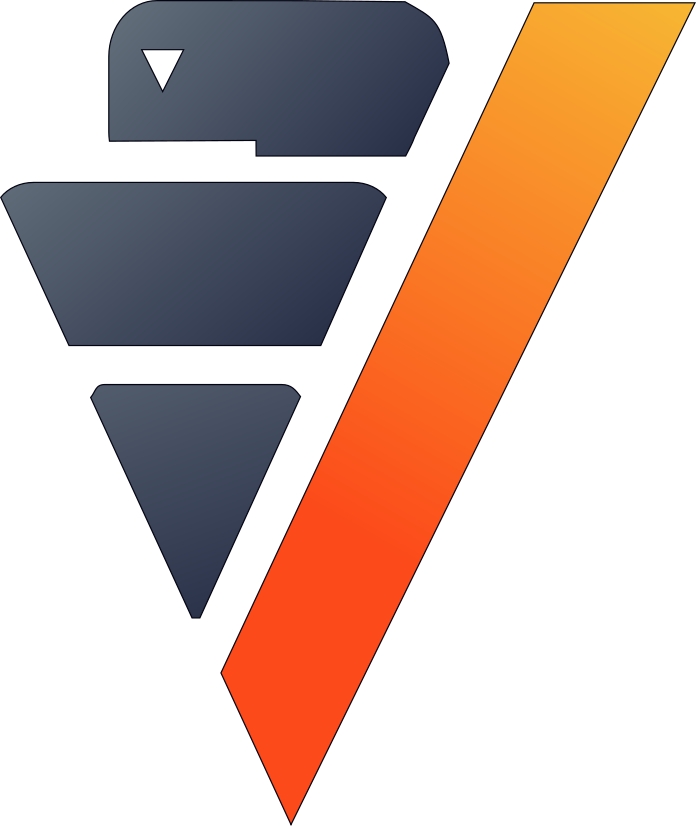

In [37]:
model_kmeans.predict(filmtv_movies_complete, 
                     name = "movies_cluster")

Let's look at the different clusters.

,"123avg_voteNumeric(6,2)",AbcperiodVarchar(6),AbcVarchar(1066),Abclanguage_areaVarchar(19),AbcVarchar(486),"123yearNumeric(8,2)",AbccountryVarchar(208),AbcCategoryVarchar(9)
1,7.0,90s,,Chinese_Japan_Asian,,1990.0,"United States, China",Action
2,3.2,Old,,Italian,,1965.0,Italy,Action
3,3.8,Old,,Italian,,1966.0,Italy,Action
4,5.1,Old,,Italian,,1968.0,Italy,Action
5,4.5,Old,,Italian,,1969.0,Italy,Action
6,5.7,Old,,Italian,,1968.0,Italy,Action
7,7.0,90s,,Chinese_Japan_Asian,,1992.0,Indonesia,Action
8,6.9,Old,,Chinese_Japan_Asian,,1983.0,Japan,Adventure
9,4.4,Old,,Italian,,1985.0,Italy,Action
10,5.5,Old,,Italian,,1966.0,Italy,Action

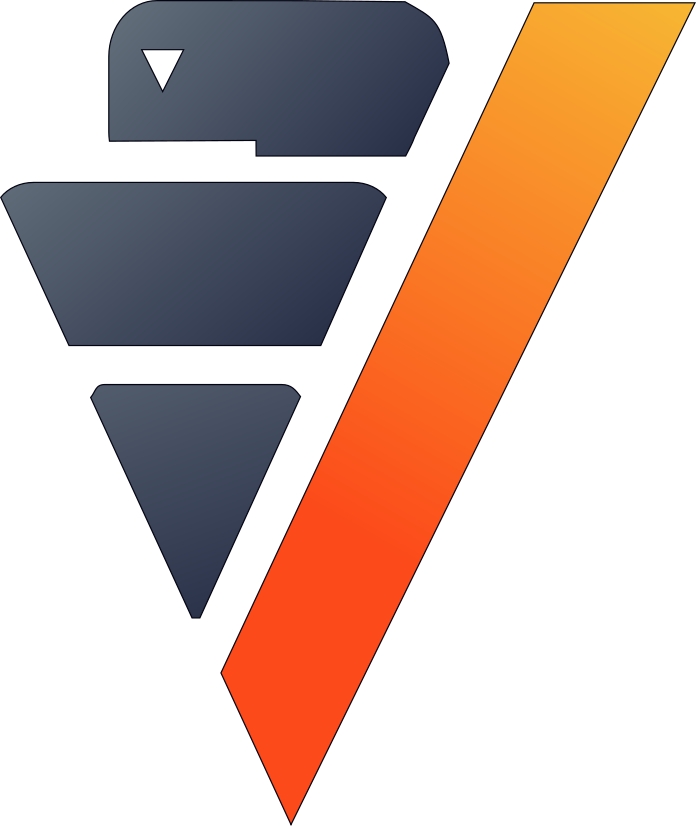

In [38]:
filmtv_movies_complete.search(filmtv_movies_complete["movies_cluster"] == 0,
                              usecols = ["avg_vote",
                                         "period",
                                         "director",
                                         "language_area",
                                         "title", 
                                         "year",
                                         "country",
                                         "Category"])

,"123avg_voteNumeric(6,2)",AbcperiodVarchar(6),AbcVarchar(1066),Abclanguage_areaVarchar(19),AbctitleVarchar(486),"123yearNumeric(8,2)",AbccountryVarchar(208),AbcCategoryVarchar(9)
1,4.0,Old,,French,Rouge baiser,1985.0,France,Drama
2,8.0,Old,,Grec_Balkan,Eldorádó,1988.0,Hungary,Drama
3,4.5,Old,,French,Arrêt sur image,1987.0,France,Drama
4,8.0,90s,,Chinese_Japan_Asian,Shi no Toge,1990.0,Japan,Drama
5,7.0,90s,,Spanish_Portuguese,Alambrado,1991.0,"Italy, Argentina",Drama
6,8.1,Old,,French,Le jour se lève,1939.0,France,Drama
7,7.6,Old,,Grec_Balkan,O Megalexandros,1980.0,Greece,Drama
8,4.0,Old,,French,A l'ombre d'un été,1976.0,France,Drama
9,8.0,90s,,French,Allemagne neuf zéro,1991.0,France,Drama
10,8.1,Old,,Russian_Est_Europe,Skrijanc na nitick,1969.0,Czechoslovakia,Drama

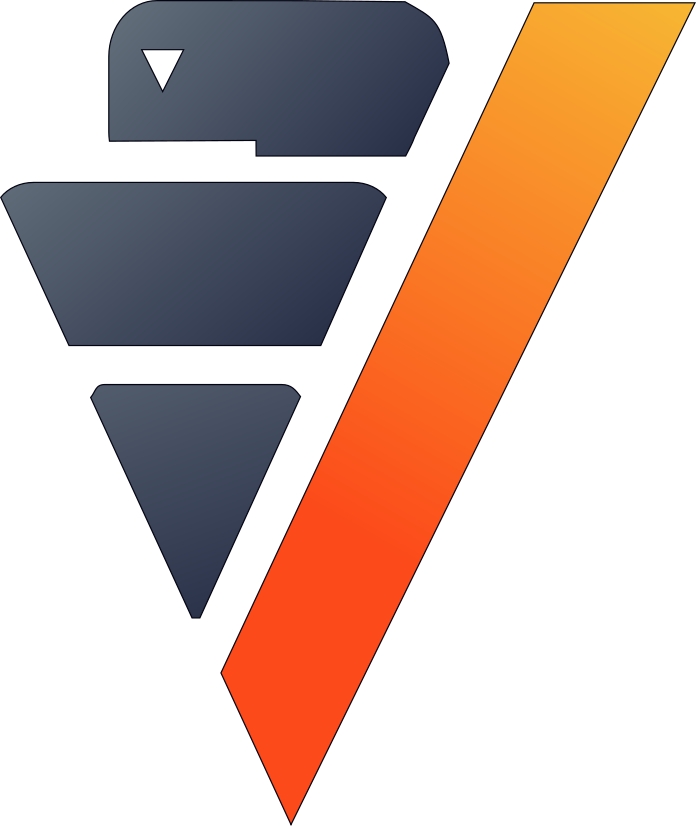

In [39]:
filmtv_movies_complete.search(filmtv_movies_complete["movies_cluster"] == 1,
                              usecols = ["avg_vote",
                                         "period",
                                         "director",
                                         "language_area",
                                         "title", 
                                         "year",
                                         "country",
                                         "Category"])

,"123avg_voteNumeric(6,2)",AbcperiodVarchar(6),AbcVarchar(1066),Abclanguage_areaVarchar(19),AbcVarchar(486),"123yearNumeric(8,2)",AbccountryVarchar(208),AbcCategoryVarchar(9)
1,7.0,Old,,English,,1966.0,United States,Action
2,6.7,Old,,English,,1932.0,United States,Action
3,4.8,Old,,English,,1966.0,United States,Action
4,7.3,Old,,English,,1969.0,Great Britain,Action
5,6.0,Old,,English,,1974.0,Great Britain,Action
6,6.6,Old,,English,,1967.0,Great Britain,Action
7,7.0,Old,,English,,1965.0,Great Britain,Action
8,6.1,Old,,English,,1971.0,Great Britain,Action
9,4.7,Old,,English,,1972.0,Great Britain,Action
10,4.5,Old,,English,,1980.0,United States,Action

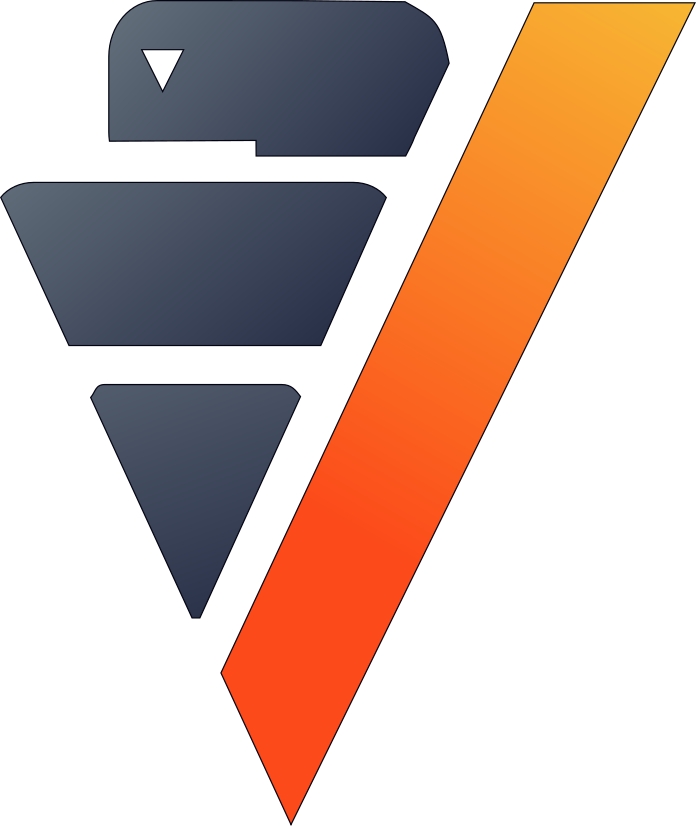

In [40]:
filmtv_movies_complete.search(filmtv_movies_complete["movies_cluster"] == 2,
                              usecols = ["avg_vote",
                                         "period",
                                         "director",
                                         "language_area",
                                         "title", 
                                         "year",
                                         "country",
                                         "Category"])

,"123avg_voteNumeric(6,2)",AbcperiodVarchar(6),AbcVarchar(1066),Abclanguage_areaVarchar(19),AbcVarchar(486),"123yearNumeric(8,2)",AbcVarchar(208),AbcCategoryVarchar(9)
1,4.0,90s,,Spanish_Portuguese,,1992.0,,Comedy
2,6.0,90s,,Spanish_Portuguese,,1990.0,,Comedy
3,6.0,90s,,Spanish_Portuguese,,1993.0,,Comedy
4,4.0,90s,,Spanish_Portuguese,,1994.0,,Comedy
5,5.2,90s,,Spanish_Portuguese,,1993.0,,Comedy
6,7.7,90s,,Spanish_Portuguese,,1991.0,,Comedy
7,7.3,90s,,Spanish_Portuguese,,1993.0,,Comedy
8,7.0,90s,,Spanish_Portuguese,,1991.0,,Comedy
9,7.4,90s,,Chinese_Japan_Asian,,1994.0,,Comedy
10,7.5,90s,,Chinese_Japan_Asian,,1993.0,,Comedy

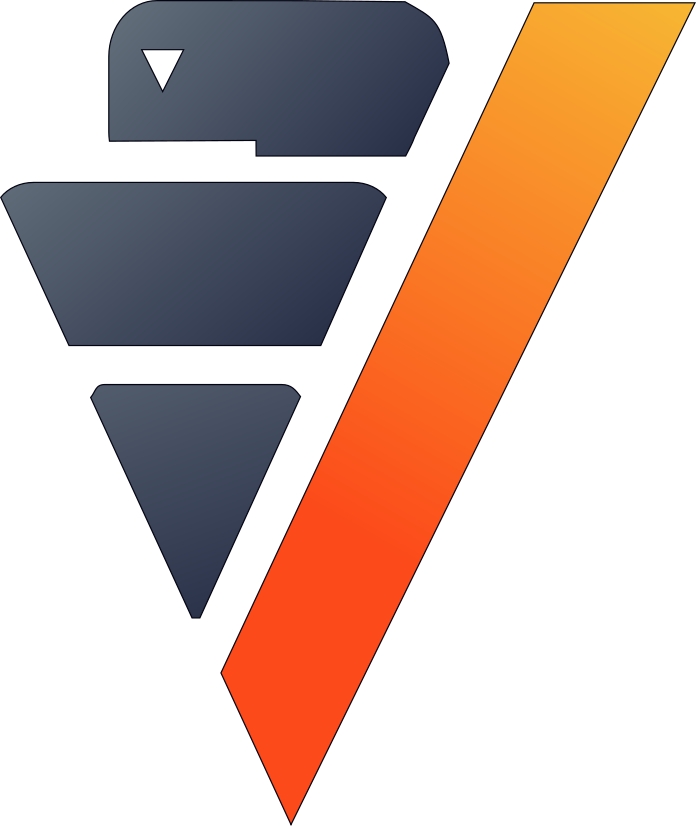

In [41]:
filmtv_movies_complete.search(filmtv_movies_complete["movies_cluster"] == 3,
                              usecols = ["avg_vote",
                                         "period",
                                         "director",
                                         "language_area",
                                         "title", 
                                         "year",
                                         "country",
                                         "Category"])

Each cluster consists of similar movies. These clusters can be used to give movie recommendations or help streaming platforms group movies together.

## Conclusion

We've solved our problem in a Pandas-like way, all without ever loading data into memory!